<a href="https://colab.research.google.com/drive/1YwGXlet0Zfl36rOvfC646UrS6l2I2jed?usp=chrome_ntp#scrollTo=cOQfKJmrDd_C" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## SIFTVAE analysis on SPM Topography data of SmBFO Combi sample
- Author - Utkarsh Pratiush (https://scholar.google.com/citations?user=BqhnGGAAAAAJ&hl=en), Aditya Raghavan(https://scholar.google.com/citations?hl=en&user=17I084UAAAAJ) and Mani Valleti (https://scholar.google.com/citations?user=Jt7c5d4AAAAJ&hl=en)
- Idea - Sergei Kalinin (https://scholar.google.com/citations?user=-cuxoSQAAAAJ&hl=en)

SPM data collected by Richard (Yu) Liu and Aditya Raghavan using AE

WTV sample provided by Emery Reece( Dr Rack's group )


In [ ]:
# reference notebook: https://github.com/saimani5/VAE-tutorials/blob/main/rvae_graphene.ipynb

## some installations and imports

Run the igor 2 installation, restart session and then run all

In [ ]:
#Installing SciFiReaders to read Igor files
!pip install SciFiReaders igor2
#AFTER THIS CELL RESTART RUNTIME ELSE It WILL NOT WORK

In [ ]:
# Installing Kornia and pyroved
!pip install -q kornia atomai git+https://github.com/ziatdinovmax/pyroVED@main

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 833.3/833.3 kB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.1/274.1 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.6/175.6 kB 378.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.4/42.4 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 38.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inflect 7.3.1 requires typ

In [ ]:
#Install Atom AI
!pip install --upgrade git+https://github.com/ziatdinovmax/atomai.git;

  Cloning https://github.com/ziatdinovmax/atomai.git to /tmp/pip-req-build-omb5xqlc
  Running command git clone --filter=blob:none --quiet https://github.com/ziatdinovmax/atomai.git /tmp/pip-req-build-omb5xqlc
  Resolved https://github.com/ziatdinovmax/atomai.git to commit 3e4c005a31d7585a7fdfe5dfbd66f7fd726258ed
  Preparing metadata (setup.py) ... done


In [ ]:
# Importing necessary packages
import torch
from torchvision.utils import make_grid
import torch.nn as nn

from tqdm import tqdm
import pyroved as pv
import kornia as K

# We will use atomai just to create the dataset (sub-images)
import atomai as aoi
from atomai import utils

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker
import cv2
import seaborn as sns
from scipy import stats
tt = torch.tensor

import SciFiReaders

import matplotlib
matplotlib.rcParams['axes.linewidth'] = 2


You don't have gwyfile installed.     If you wish to open .gwy files, you will need to      install it (pip install gwyfile) before attempting.


In [ ]:
def normalize(data):
  if data.ndim == 2:
    return (data - np.min(data))/(np.ptp(data))
  elif data.ndim == 3:
    norm_imgs = np.zeros_like(data)
    for i in range(len(data)):
      norm_imgs[i] = (data[i] - np.min(data[i]))/(np.ptp(data[i]))
    return norm_imgs

## get data

In [ ]:
!gdown --folder https://drive.google.com/drive/folders/14PkKgFuuC2_vEBafP9BDvkrghZtykQsA?usp=sharing --fuzzy

Retrieving folder contents
Processing file 14RqKNN6DEL9toHm4UD_NNZ_m1N3NSQzY WTV_Loc001_0000.ibw
Processing file 14WmxMNfLTYeEaDY6Kb1rqnhKwv9wHdL8 WTV_Loc002_0000.ibw
Processing file 14c5-YmkUEuErvU6lLSaUlihNquDk3uC_ WTV_Loc003_0000.ibw
Processing file 14dpfl5PP54lj4Y2CpBM3lowu5y2lFOgp WTV_Loc004_0000.ibw
Processing file 14j7sD_b_n4_h8kaAVaIF6uKVLBBNIQ5E WTV_Loc005_0000.ibw
Processing file 14ogZJw1ubPyYc0PCCkpFs4RVCHI3iUPO WTV_Loc006_0000.ibw
Processing file 1508S2nRpXLBnekB7f5vin9IA_WNVSMgJ WTV_Loc007_0000.ibw
Processing file 14zh_NhigkUwlbX3cRYHUp2q_Tc75fRd9 WTV_Loc008_0000.ibw
Processing file 14y62lnPCkYEqcmb1jueifpqKSwQ9LBmO WTV_Loc009_0000.ibw
Processing file 14vWeEMWBjyui77pzsfHmQM7zU17G-lWG WTV_Loc010_0000.ibw
Processing file 14rogCYtT3EORU3yih22WBp0-P5txOZFe WTV_Loc011_0000.ibw
Processing file 15KQmENQRzUzf1Yrkrr-iJU4wqN9MHCRU WTV_Loc012_0000.ibw
Processing file 1587J80tKemaL_CNKYaW1QkcMeq4P2AAE WTV_Loc013_0000.ibw
Processing file 15VaAmIbYk_663dq9NmiIPC6iG07OfOOr WTV_Loc014_00

# data import

In [ ]:
import os
# Get the list of all files and directories
if 'google.colab' in str(get_ipython()):
  print('Running on CoLab')
  path = "/content/WTV_AG2/"
else:
  print('Not running on CoLab')
  path = "WTV_AG2/"

dir_list = os.listdir(path)
dir_list.sort()

Running on CoLab


In [ ]:
# Get the list of all files in the directory
file_names = os.listdir(path)
file_names.sort()

# Create a dictionary to store the data
all_data = {}

# Iterate over each file
for file_name in file_names:
    # Extract the location number from the file name
    location_number = file_name.split('_')[1]  # Assumes file name format is "WTV_LocXXX_0000.ibw"

    # Construct the full file path
    ibw_file = os.path.join(path, file_name)

    # Read the data from the IBW file
    reader = SciFiReaders.IgorIBWReader(ibw_file)
    data = reader.read()

    # Store the data in the dictionary with the location number as the key
    all_data[location_number] = data

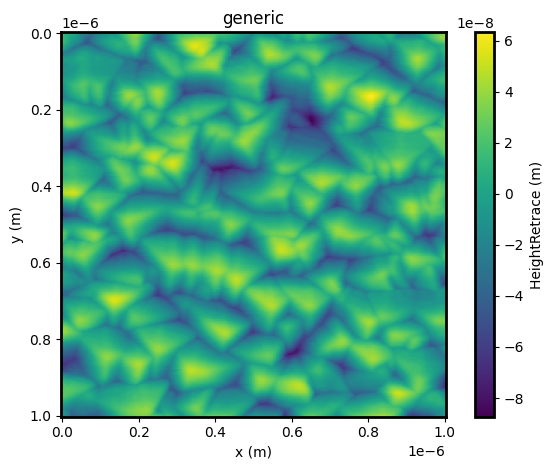

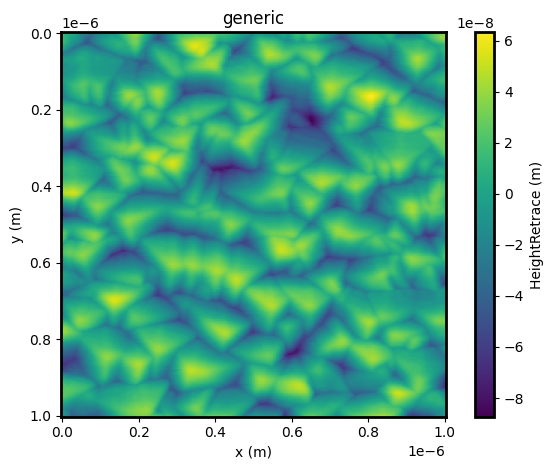

In [ ]:
all_data['Loc001'][0].plot()

In [ ]:
# Make a stack of images
image_stack = []

# Iterate over each location and append the image data to the stack
for location, data in all_data.items():
    # Append the image data for the current location
    image_stack.append(data[0])

In [ ]:
image_stack = np.array(image_stack)

(-0.5, 255.5, 255.5, -0.5)

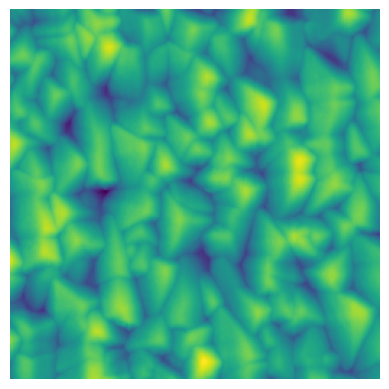

In [ ]:
plt.imshow(image_stack[1])
# plt.colorbar()
plt.axis('off')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker
import cv2
import seaborn as sns
from scipy import stats

In [ ]:
Mo_comp = np.linspace(0.14, 0.88, 20)
print(Mo_comp)

[0.14       0.17894737 0.21789474 0.25684211 0.29578947 0.33473684
 0.37368421 0.41263158 0.45157895 0.49052632 0.52947368 0.56842105
 0.60736842 0.64631579 0.68526316 0.72421053 0.76315789 0.80210526
 0.84105263 0.88      ]


In [ ]:
fr_num = np.linspace(1,20,20)

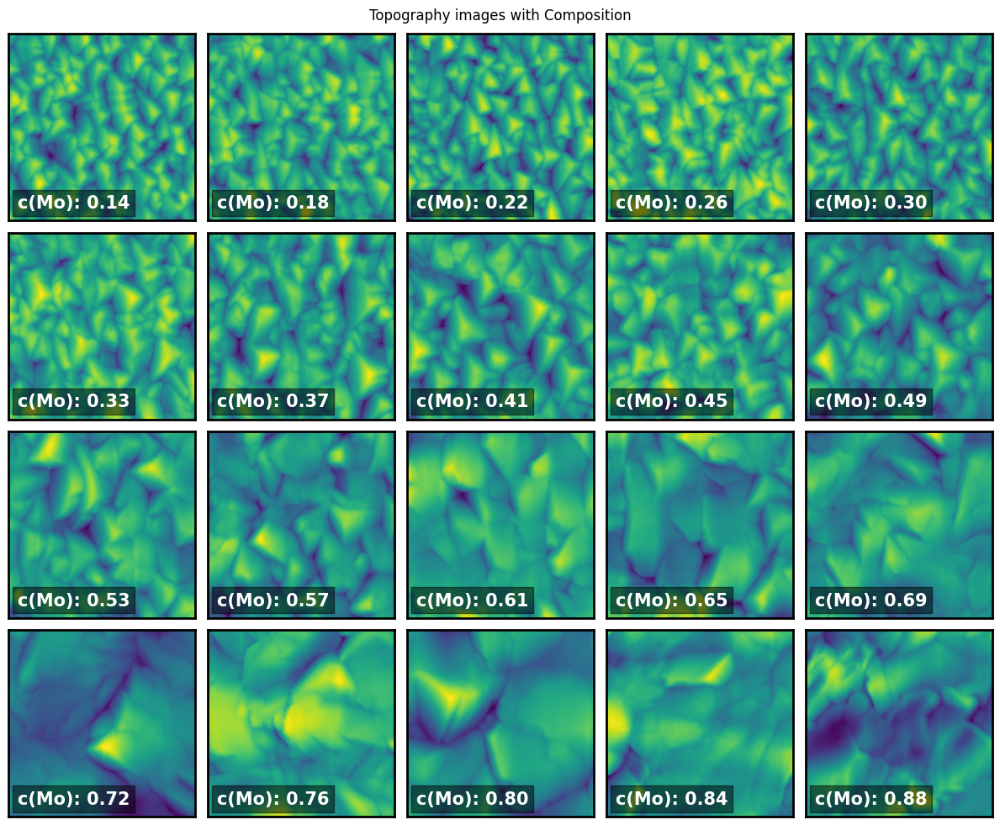

In [ ]:
fig, axes = plt.subplots(4, 5, figsize=(12, 10))  # Create a 4x5 grid of subplots (adjust figsize for better fit)

# Iterate through the images and display them with composition
for i in range(4):
  for j in range(5):
    index = i * 5 + j  # Calculate the index for each image in the stack
    if index < len(image_stack):  # Check if we have enough images
      # Display image
      axes[i, j].imshow(image_stack[index])
      axes[i, j].set_xticks([])  # Hide x-axis ticks
      axes[i, j].set_yticks([])  # Hide y-axis ticks
      # axes[i, j].set_aspect('auto')  # Adjust aspect ratio for better fit (optional)

      # Display composition (assuming Mo_comp is a NumPy array)
      composition_text = f"c(Mo): {Mo_comp[index]:.2f}"   # Format composition string
      axes[i, j].text(0.05, 0.05, composition_text, c='white', ha='left', va='bottom', fontsize=15, transform=axes[i, j].transAxes, fontweight = 'bold',  bbox=dict(facecolor='black', alpha=0.5))  # Add composition text

    else:
      axes[i, j].axis('off')  # Hide empty subplots

# Optional: Add a title
fig.suptitle('Topography images with Composition', fontsize=12)

plt.tight_layout()  # Adjust spacing between subplots
plt.show()


In [ ]:
# If the image in small and the number of patches is too few, the image can be enlarged to get more patches. But make sure you are able to cover the complexity. This problem is dicussed in the supplementary part of the paper.

"""resized_ht = []
for image in image_stack:
    # Resize the image using cv2.resize
    resized_image = cv2.resize(np.array(image), (2048, 2048), interpolation=cv2.INTER_NEAREST)
    # Append the resized image to the resized image stack
    resized_ht.append(resized_image)"""

'resized_ht = []\nfor image in image_stack:\n    # Resize the image using cv2.resize\n    resized_image = cv2.resize(np.array(image), (2048, 2048), interpolation=cv2.INTER_NEAREST)\n    # Append the resized image to the resized image stack\n    resized_ht.append(resized_image)'

In [ ]:
coords = utils.get_coord_grid(np.array(image_stack), 60)
print(coords[5].shape)
patch10, _, f_num = utils.extract_subimages(image_stack, coords, 60 )
print(patch10.shape, f_num.shape)

(25, 3)
(180, 60, 60) (180,)


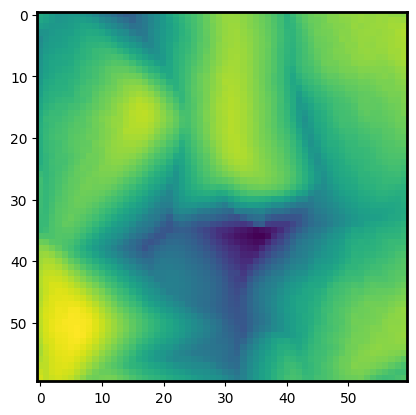

In [ ]:
plt.imshow(patch10[12,:,:])

In [ ]:
coords = utils.get_coord_grid(image_stack, 30)
print(coords[19].shape)
patch10, _, fn = utils.extract_subimages(image_stack, coords, 30 )
print(patch10.shape)

(81, 3)
(1280, 30, 30)


In [ ]:
w_s_max = 30
original_coordinates = coords[0][:,0:2]
filtered_coordinates = np.array([coord for coord in original_coordinates if (w_s_max + 5) <= coord[0] < (image_stack[0].shape[1]-(w_s_max + 5)) and (w_s_max + 5) <= coord[1] < (image_stack[0].shape[1]-(w_s_max + 5))])

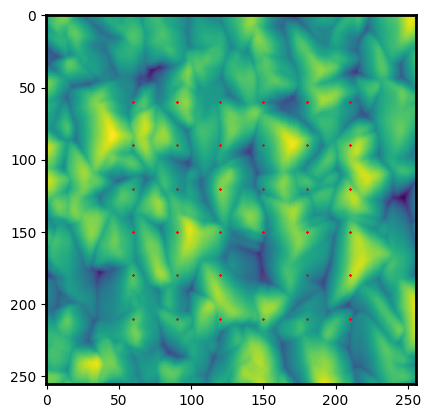

In [ ]:
filtered_coordinates
plt.imshow(image_stack[5])
plt.scatter(filtered_coordinates[:,1],filtered_coordinates[:,0], s =1, marker= "x", c= 'r')

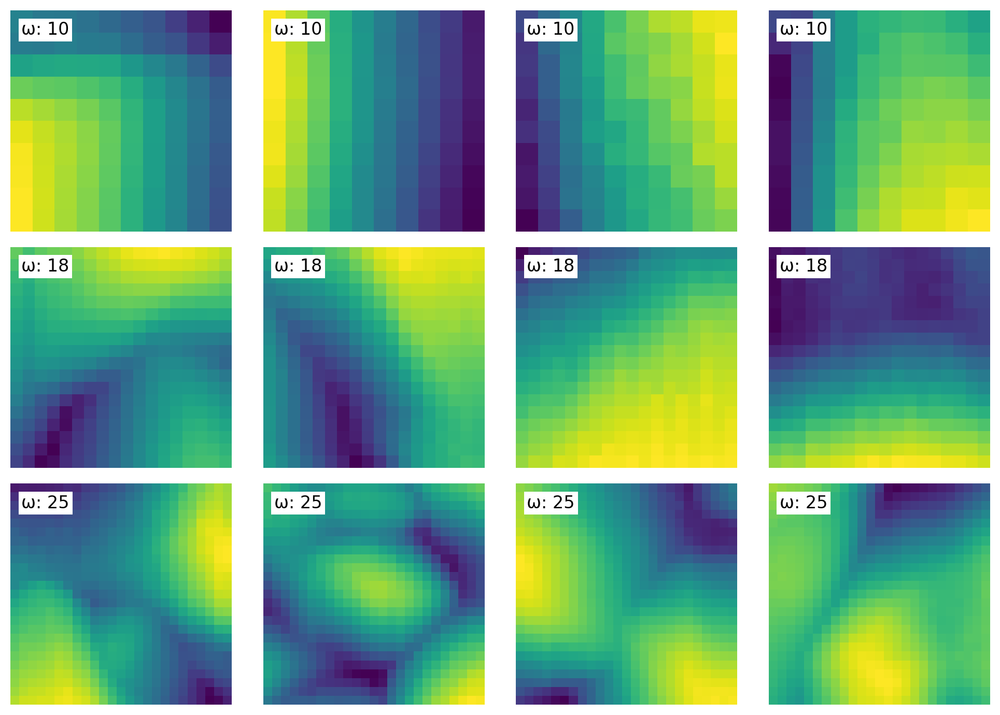

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming resized_ht is your image array and utils is already imported
patch_sizes = np.array([10, 18, 25])  # Define 3 patch sizes
fig, axes = plt.subplots(3, 4, figsize=(10, 7), dpi=200)  # Create a 3x4 grid of plots

for i, patch_size in enumerate(patch_sizes):
    coords = utils.get_coord_grid(image_stack, patch_size)  # Get coordinates for the current patch size
    patches, _, _ = utils.extract_subimages(image_stack, coords, patch_size)  # Extract patches
    selected_indices = np.random.choice(patches.shape[0], 4, replace=False)
    if patches.shape[0] > 0:  # Check if any patches were extracted
        # Randomly select 4 unique indices


        for j, idx in enumerate(selected_indices):  # Plot 4 examples for each window size
            ax = axes[i, j]
            ax.imshow(patches[idx, :, :])  # Display the selected patch
            # Reduce the size of the text box by adjusting padding and possibly font size
            ax.text(0.05, 0.95, f'ω: {patch_size}', fontsize=12, verticalalignment='top', color='black',
                    transform=ax.transAxes, bbox=dict(facecolor='white', edgecolor='none', pad=2))
            ax.axis('off')  # Hide axes for cleaner look

plt.tight_layout()
plt.show()


# Preprocessing

In [ ]:
def get_uniform_patches(img : np.ndarray, cords, w_s: int ):
  """
  Creates patches of size w_s around coords

  Args:
    img: image to make patches from: numpy array
    coords: coordinates of points around which the patches are taken
    w_s: size of patches: int

  """
  # norm_image = normalize(img)

  #extract patches for each point on a grid
  features_all, _, frame_number = utils.extract_subimages(img, cords, w_s)
  print(features_all.shape)

  return features_all, frame_number

def get_coordinates_single_patch(img : np.ndarray, w_s: np.ndarray ):
  """
  Get's coordinates for the single image for the maximum value of w_s in the array

  Args:
    img: image to make patches from: numpy array
    w_s: numpy array of window size iterating in the VAE

  """
  img = np.array(img)
  w_s_max = np.max(w_s) + 5
  coords = utils.get_coord_grid(img, w_s_max )
  fil_crds = []
  original_coordinates = coords[0][:,0:2]
  filtered_coordinates = np.array([coord for coord in original_coordinates if (w_s_max + 5) <= coord[0] < (img.shape[1]-(w_s_max + 5)) and (w_s_max + 5) <= coord[1] < (img.shape[1]-(w_s_max + 5))])

  return filtered_coordinates

def get_coordinates(img : np.ndarray, w_s: np.ndarray ):
  """
  Get's coordinates for the image stack for the maximum value of w_s in the array


  Args:
    img: image to make patches from: numpy array
    w_s: numpy array of window size iterating in the VAE

  """
  num_images= img.shape[0]
  w_s_max = np.max(w_s) + 5
  coords = utils.get_coord_grid(img, w_s_max )
  dict_coord = {}
  original_coordinates = coords[0][:,0:2]
  filtered_coordinates = np.array([coord for coord in original_coordinates if (w_s_max ) <= coord[0] < (img.shape[1]-(w_s_max + 5)) and (w_s_max ) <= coord[1] < (img.shape[1]-(w_s_max + 5))])
  extra_z_coordinate = np.zeros((filtered_coordinates.shape[0], 1))
  # This a hacky way to get things working ---> as atomai stem images coordinates has extra dimension for atom type. SPM images dont have such case.
  coordinates_3d = np.concatenate((filtered_coordinates, extra_z_coordinate), axis=1)

  for i in range(num_images):
        dict_coord[i] =  coordinates_3d


  return dict_coord

In [ ]:
ws = np.arange(5, 35, 1) # define what window sizes need to be cropped from our patches

In [ ]:
# use to test and see if the number of patches is same accross all window sizes. can be made as a test function
crds = get_coordinates(image_stack, ws)
# print(crds.shape)
pach10 = get_uniform_patches(image_stack, crds, 5)
pach30 = get_uniform_patches(image_stack, crds, 10)
pach50 = get_uniform_patches(image_stack,crds, 20)
# print(pach10.shape, pach30.shape, pach50.shape)

(500, 5, 5)
(500, 10, 10)
(500, 20, 20)


#VAE with rotational and tranlational invariances

This is a simple VAE that considers same featurs with different rotational angles and ones at different postions to be the same. This enables to capture the variation in the underlying features more accurately

In [ ]:
w_s = 35 # choose only one window size here. This is a standard VAE to demomnstrate the difference from SI-VAE

In [ ]:
co_ords = get_coordinates(image_stack, w_s)

In [ ]:
patches, f_num = get_uniform_patches(image_stack, co_ords, w_s)

patches = normalize(np.squeeze(patches))

(500, 35, 35)


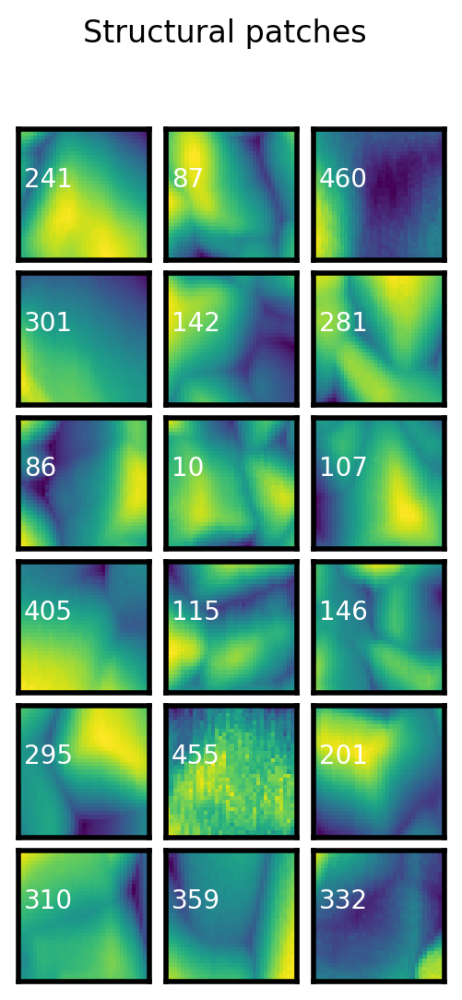

In [ ]:
#plot examples of patches
fig, axes = plt.subplots(6, 3, figsize=(3, 6), dpi = 200,
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

fig.suptitle('Structural patches')

for ax in axes.flat:
    i = np.random.randint(len(patches))
    ax.imshow(patches[i], interpolation='nearest')
    ax.text(1, 15, str(i), color='white')

In [ ]:
#construct image stack and loader for VAE
vae_data = torch.tensor(patches).float()
vae_loader = pv.utils.init_dataloader(vae_data, batch_size=120)

In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (w_s, w_s)

vae_vanilla = pv.models.iVAE(in_dim, latent_dim=2, invariances=['r','t'],
                      sampler_d='continuous_bernoulli', seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(vae_vanilla)
training_losses = []

# Train for n epochs:
for e in range(1000):
    trainer.step(vae_loader)
    trainer.print_statistics()
    # training_loss = trainer.loss
    # training_losses.append(training_loss)

Epoch: 1 Training loss: -18.9135
Epoch: 2 Training loss: -25.0990
Epoch: 3 Training loss: -38.6136
Epoch: 4 Training loss: -60.6096
Epoch: 5 Training loss: -83.7485
Epoch: 6 Training loss: -93.2310
Epoch: 7 Training loss: -103.8963
Epoch: 8 Training loss: -119.6832
Epoch: 9 Training loss: -137.9502
Epoch: 10 Training loss: -146.9897
Epoch: 11 Training loss: -156.2970
Epoch: 12 Training loss: -159.6045
Epoch: 13 Training loss: -162.2869
Epoch: 14 Training loss: -157.1277
Epoch: 15 Training loss: -165.6575
Epoch: 16 Training loss: -179.6322
Epoch: 17 Training loss: -181.3805
Epoch: 18 Training loss: -186.5402
Epoch: 19 Training loss: -186.6784
Epoch: 20 Training loss: -189.6675
Epoch: 21 Training loss: -190.4477
Epoch: 22 Training loss: -200.6554
Epoch: 23 Training loss: -203.9067
Epoch: 24 Training loss: -202.8667
Epoch: 25 Training loss: -201.4427
Epoch: 26 Training loss: -205.4953
Epoch: 27 Training loss: -211.7736
Epoch: 28 Training loss: -200.9662
Epoch: 29 Training loss: -202.8577


<ipython-input-72-ccc2e2ba80d6>:10: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=z_mean_std[:, -1], y=z_mean_std[:, -2], cmap="coolwarm", thresh = 0.025, levels = 100, alpha = 0.7, shade=True)


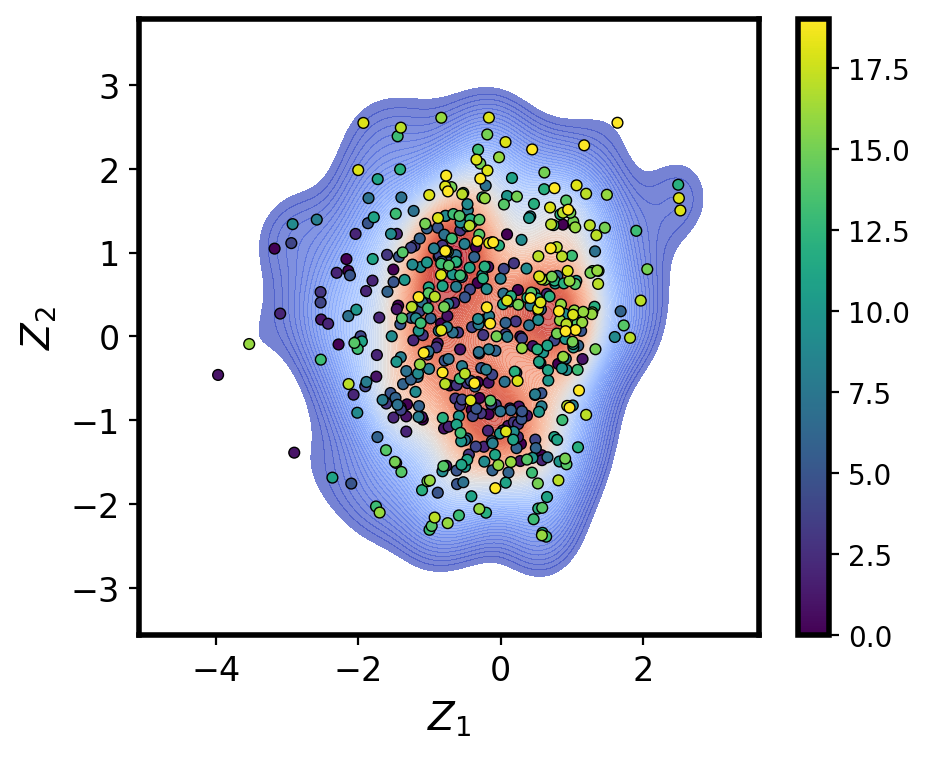

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

z_mean_std, z_std = vae_vanilla.encode(vae_data)
# Creating a figure with seaborn
plt.figure(figsize=(5, 4), dpi = 200, facecolor='white')

# KDE plot
sns.kdeplot(x=z_mean_std[:, -1], y=z_mean_std[:, -2], cmap="coolwarm", thresh = 0.025, levels = 100, alpha = 0.7, shade=True)

# Scatter plot
sc = plt.scatter(z_mean_std[:, -1], z_mean_std[:, -2],  s=15, c = f_num, cmap = 'viridis', alpha = 1, edgecolor='k', linewidth=0.5)


# Adding labels and title
plt.xlabel("$Z_1$", fontsize=14)
plt.ylabel("$Z_2$", fontsize=14)
# plt.title("Scatter Plot of Latent Variables with KDE", fontsize=16, pad=15)

plt.colorbar(sc)

# Increasing size of ticks
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)


# Displaying the plot
plt.show()


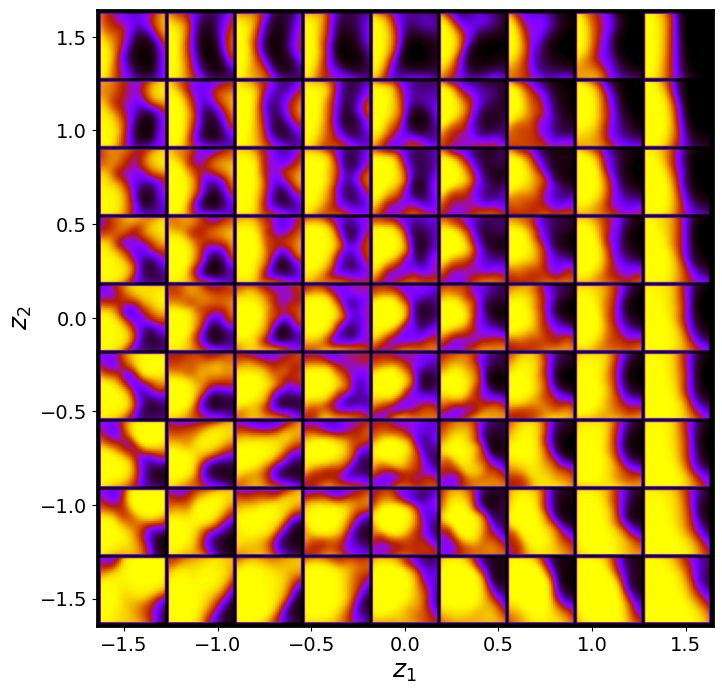

tensor([[[0.7252, 0.6735, 0.6224,  ..., 0.7827, 0.8239, 0.8551],
         [0.7334, 0.6809, 0.6288,  ..., 0.7998, 0.8391, 0.8688],
         [0.7441, 0.6912, 0.6388,  ..., 0.8114, 0.8497, 0.8789],
         ...,
         [0.9893, 0.9812, 0.9670,  ..., 0.1896, 0.2470, 0.3077],
         [0.9874, 0.9782, 0.9623,  ..., 0.1972, 0.2474, 0.3009],
         [0.9850, 0.9746, 0.9571,  ..., 0.2100, 0.2522, 0.2976]],

        [[0.8363, 0.7978, 0.7599,  ..., 0.2746, 0.3244, 0.3785],
         [0.8697, 0.8368, 0.8041,  ..., 0.2951, 0.3491, 0.4070],
         [0.9008, 0.8740, 0.8471,  ..., 0.3169, 0.3749, 0.4361],
         ...,
         [0.9978, 0.9962, 0.9932,  ..., 0.0653, 0.0790, 0.0959],
         [0.9973, 0.9955, 0.9921,  ..., 0.0667, 0.0762, 0.0884],
         [0.9967, 0.9946, 0.9907,  ..., 0.0723, 0.0780, 0.0863]],

        [[0.8887, 0.8698, 0.8549,  ..., 0.1398, 0.1794, 0.2251],
         [0.9226, 0.9083, 0.8966,  ..., 0.1533, 0.1981, 0.2491],
         [0.9490, 0.9384, 0.9290,  ..., 0.1679, 0.2178, 0.

In [ ]:
vae_vanilla.manifold2d(d = 9) # sigma = 0.6

# SIFTVAE

In [ ]:
# plotting utility
from pyroved.utils import generate_latent_grid, plot_img_grid
from typing import Optional, Tuple, Union, List
from typing import Union, List, Tuple
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import os


#*****************************************************manifold2d
def plot_img_grid_custom(imgdata: torch.Tensor, d: int, ws: int,
                  **kwargs: Union[str, int, List[float]]) -> None:
    """
    Plots a *d*-by-*d* square grid of 2D images
    """


    if imgdata.ndim < 3:
        raise AssertionError("Images must be passed as a 3D or 4D tensor")
    imgdata = imgdata[:, None] if imgdata.ndim == 3 else imgdata
    grid = make_grid(imgdata, nrow=d,
                     padding=kwargs.get("padding", 2),
                     pad_value=kwargs.get("pad_value", 0)).cpu()
    extent = kwargs.get("extent")
    # Put on cpu in case all tensors are created on gpu by default
    extent_ = [e.cpu() for e in extent]
    plt.figure(figsize=(4, 5), dpi = 200)
    plt.imshow(grid[0].squeeze(), cmap=kwargs.get("cmap", "gnuplot"),
               origin=kwargs.get("origin", "upper"),
               extent=extent_)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.text(-1.75, 1.75, f'ω: {ws}', fontsize=14, fontweight = 'bold', verticalalignment='top', color='white',
        bbox=dict(boxstyle="round", facecolor='black', edgecolor='none'))
    plt.xlabel("$z_1$", fontsize=18)
    plt.ylabel("$z_2$", fontsize=18)
    # plt.tight_layout()

    # plt.title(f"2dmanifold_window_size{ws}", fontsize=20)
    plt.savefig(f"manifold/2dmanifold_window_size{ws}")
    plt.show()



def get_custom_manifold2d(local_vae, d: int, ws=1):
    """
    Plots a learned latent manifold in the data space

    Args:
        d: Grid size
        plot: Plots the generated manifold (Default: True)
        y: Conditional "property" vector (e.g. one-hot encoded class vector)
        kwargs: Keyword arguments include custom min/max values
                for grid boundaries passed as 'z_coord'
                (e.g. z_coord = [-3, 3, -3, 3]), 'angle' and
                'shift' to condition a generative model on, and plot parameters
                ('padding', 'pad_value', 'cmap', 'origin', 'ylim')
    """
    os.makedirs("manifold", exist_ok=True)
    z, (grid_x, grid_y) = generate_latent_grid(d, z_coord = [-2,2,-2,2])
    z = [z]

    loc = local_vae.decode(*z, )

    plot_img_grid_custom(
                loc, d,ws = ws,
                extent=[grid_x.min(), grid_x.max(), grid_y.min(), grid_y.max()])



    return loc


#**************************************************************************latent representation with KDE

def plot_latent_rep_with_kde(z_mean, z_sd, ws, folder):

    fig, _ = plt.subplots(figsize = (4 , 5), dpi = 200)

    os.makedirs(folder, exist_ok=True)
    im =plt.scatter(z_mean[:,-2], z_mean[:,-1], s=4, c = f_num, cmap = 'plasma', edgecolors='black',linewidths=0.1 )
    plt.gca().set_aspect('equal')
    try:
        sns.kdeplot(x=z_mean[:, -2], y=z_mean[:, -1], fill=True, thresh=0.01, levels=50, cmap="autumn", shade=True, alpha=0.3)
    except ValueError :
        print("kde -didnt work")
    plt.xlim([-5,5])
    os.makedirs(folder, exist_ok=True)
    plt.ylim([-5,5])
    plt.xlabel("$Z_1$", fontsize=14)
    plt.ylabel("$Z_2$", fontsize=14)

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)

    plt.text(-4.5, 4.5, f'ω: {ws}', fontsize=15, verticalalignment='top', color='black')

    cbar = fig.colorbar(im, shrink=.645)
    cbar.set_label("Frame Number", fontsize=12)
    cbar.ax.tick_params(labelsize=10)
    cbar.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    # plt.title(f"latent distribution_window_size{ws}", fontsize=10)
    plt.savefig(f"{folder}/latent_distribution_window_size{ws}.png")


#****************************************plot latent images


#****************************************plot features on atoms images

def visualize_on_patches_latent_images(spm_image_stack, frames_all, frame, z1, z2, z3, filtered_coordinates, ws, folder):
    """
    Visualizes the latent space encodings on the raw STEM image for a given frame.

    Parameters:
    - image
    - z1: Feature set one interested in
    - z2: Feature set two interested in

    Returns:
    - None: Displays a matplotlib figure with the visualization.
    """

    spm_image = spm_image_stack[frame]
    os.makedirs(folder, exist_ok=True)
    com_i = filtered_coordinates
    col_min0 = z1.min()
    col_max0 = z1.max()
    col_min1 = z2.min()
    col_max1 = z2.max()
    z1_i = z1[frames_all == frame]
    z2_i = z2[frames_all == frame]
    z3_i = z3[frames_all == frame]

    col_min2 = z3.min()
    col_max2 = z3.max()

    fig, ax = plt.subplots(1, 3, figsize=(30, 10))
    # fig, ax = plt.subplots(1, 2, figsize=(30, 10))
    ax[0].imshow(spm_image)
    ax[0].scatter(com_i[:,1],com_i[:,0], c=z1_i, s=15,
                  cmap="jet", vmin=col_min0, vmax=col_max0)
    ax[0].set_title("Angle Encoding", fontsize=18)
    ax[0].axis('off')


    ax[1].imshow(spm_image)
    ax[1].scatter(com_i[:,1],com_i[:,0], c=z2_i, s=15,
                  cmap="jet", vmin=col_min0, vmax=col_max0)
    ax[1].set_title("Latent variable 1", fontsize=18)
    ax[1].axis('off')

    ax[2].imshow(spm_image)
    ax[2].scatter(com_i[:,1],com_i[:,0], c=z3_i, s=15,
                  cmap="jet", vmin=col_min0, vmax=col_max0)
    ax[2].set_title("Latent variable 2", fontsize=18)
    ax[2].axis('off')

    cbar = ax[0].figure.colorbar(ax[0].collections[0], ax=ax[0], orientation='vertical', shrink = 0.7)
    cbar.set_label('Angle encoding', rotation=270, labelpad=16, fontsize = 16)
    cbar = ax[1].figure.colorbar(ax[1].collections[0], ax=ax[1], orientation='vertical', shrink = 0.7)
    cbar.set_label('latent variable 1', rotation=270, labelpad=16, fontsize = 16)
    cbar = ax[2].figure.colorbar(ax[2].collections[0], ax=ax[2], orientation='vertical', shrink = 0.7)
    cbar.set_label('latent variable 2', rotation=270, labelpad=16, fontsize = 16)

    fig.suptitle(f"vizualize_latent_variables_on_patches", fontsize=20)
    plt.savefig(f"{folder}/vizualize_features_on_patches{ws}.png")
    plt.show()


# Example of calling the function:
# visualize_latent_encodings(frame, com_all, frames_all, lattice_coord, z1, z3, STEM_real)


# Example of calling the function:
# visualize_latent_encodings(frame, com_all, frames_all, lattice_coord, z1, z3, STEM_real)


In [ ]:
def calculate_dispersion(latent_vars):
  """
  Calculates the mean and variance (dispersion) of latent variables.

  Args:
      latent_vars (numpy.ndarray): Array containing latent variables (data points x dimensions).

  Returns:
      tuple: A tuple containing the mean vector and variance array.
  """
  mean_latent_vector = np.mean(latent_vars, axis=0)
  variance = np.var(latent_vars, axis=0)
  return mean_latent_vector, variance

def calculate_dispersion_per_frame(latent_vars, frames_all):
  """
  Calculates the mean and variance of latent variables for each frame.

  Args:
      latent_vars (numpy.ndarray): Array containing latent variables (data points x dimensions).
      frames_all (list or array): List or array indicating the frame number for each data point.

  Returns:
      list: A list containing tuples of (mean_vector, variance_array) for each frame.
  """
  dispersions_per_frame = []
  for frame in np.unique(frames_all):
    frame_data = latent_vars[frames_all == frame]  # Select data points for the current frame
    mean_vector, variance_array = calculate_dispersion(frame_data)
    # dispersions_per_frame.append((mean_vector, variance_array))
  return mean_vector, variance_array


In [ ]:
# utilitily function called at each epoch for data curation
import cv2

def resize_image_stack(imstack, size=(40, 40)):
    """
    Resize each image in each image stack within the given list of image stacks.
    """
    resized_imstack = np.array([cv2.resize(img, size, interpolation=cv2.INTER_LINEAR) for img in imstack])
    return resized_imstack

def get_data_loader(image_stack, batch_size = 512):
  final_train = tt(image_stack)
  final_trainloader = pv.utils.init_dataloader(final_train, batch_size=batch_size)
  return final_train, final_trainloader



In [ ]:
window_size_consistent = 40
# Ititialize model
in_dim = (window_size_consistent, window_size_consistent)
rvae_super = pv.models.iVAE(in_dim, latent_dim=2,   # Number of latent dimensions other than the invariancies
                               hidden_dim_e = [128, 128],   # corresponds to the number of neurons in the hidden layers of the encoder
                               hidden_dim_d = [128, 128],   # corresponds to the number of neurons in the hidden layers of the decoder
                               invariances= ['r', 't'], seed=0, sampler_d = 'continuous_bernoulli')

# future addition: like STEM counter part add rtVAE option-> should be trivial
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_super)


In [ ]:
ws = np.arange(5, 35, 1) # define what window sizes need to be cropped from our patches

In [ ]:
co_ords = get_coordinates(image_stack, ws)
_, f_num = get_uniform_patches(image_stack, co_ords, 10)

(500, 10, 10)


In [ ]:
f_num.shape

(500,)

In [ ]:
array_evolution = []
co_ords = get_coordinates(image_stack, ws)
for i,j in tqdm(enumerate(ws)):
    print("data curation started")
    patches, f_num = get_uniform_patches(image_stack, co_ords, j)

    patches = normalize(np.squeeze(patches))

    print(f"Number of patches: {patches.shape[0]}")
    resized_imstack = resize_image_stack(patches, size=(40, 40))
    final_train, final_trainloader = get_data_loader(resized_imstack, batch_size = 100) # original batch_size = 512
    print("data curation ended")
    print("window_size", j)
    for e in range(100):
        trainer.step(final_trainloader, scale_factor=3)
        trainer.print_statistics()


    z_mean, z_sd = rvae_super.encode(final_train)
    array_evolution.append(z_mean)
    # plot latent manifold:
    get_custom_manifold2d(rvae_super,d = 9, ws = j);   # d corresponds to the number of points sampled in each latent dimension
    # plot latent rep
    plot_latent_rep_with_kde(z_mean, z_sd, ws = j, folder = "dist")
    # plot latent images
    z1, z2, z3 = z_mean[:,0], z_mean[:, -2], z_mean[:, -1] #--> if 3 latent dim
    # visualize_on_patches_latent_images(resized_ht, f_num, 1, z1, z2, z3, co_ords[0], ws = j, folder = "latent_img")
    #visualize_on_patches_latent_images(resized_ht, f_num, 1, z1, z2, z3, co_ords[0], ws = j, folder = "latent_img")
    # visualize_on_patches_latent_images(resized_ht[19], z1, z2, co_ords, ws = j, folder = "latent_img")
    # visualize_latent_images(2, com_all, frames_all, lattice_coord, z1, z3, STEM_real, ws =j)
    # visualize_latent_images(4, com_all, frames_all, lattice_coord, z1, z3, STEM_real, ws =j)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
rvae_super.save_weights(f"weights_WTV")

In [ ]:
from google.colab import files

In [ ]:
np.savez("array_evolution_WTV.npz", array_evolution= np.array(array_evolution))

## Now postprocessing evolution of window size

In [ ]:
array_evolution = np.load("/content/array_evolution_WTV.npz")["array_evolution"]
array_evolution.shape

(30, 500, 5)

Text(0.5, 1.0, 'Evolution of Angle encoding for all atoms')

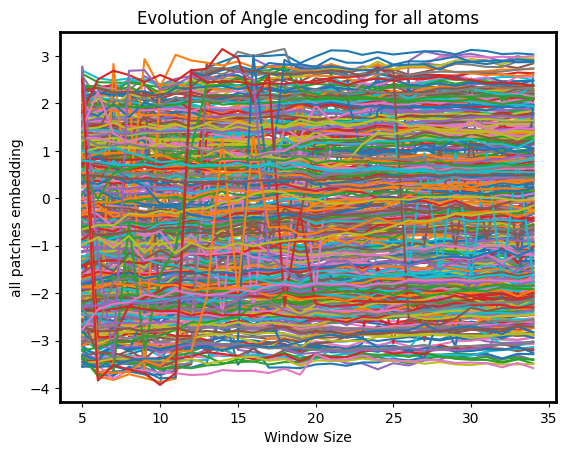

In [ ]:
plt.plot(ws, array_evolution[:,:,0]);
plt.xlabel("Window Size")
plt.ylabel("all patches embedding")
# Adding a title to the plot
plt.title("Evolution of Angle encoding for all atoms")

Text(0.5, 1.0, 'Evolution of Translation-X for all atoms')

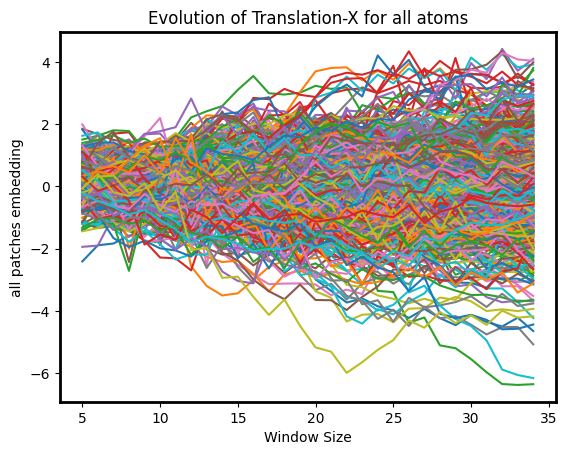

In [ ]:
plt.plot(ws, array_evolution[:,:,1]);
plt.xlabel("Window Size")
plt.ylabel("all patches embedding")
# Adding a title to the plot
plt.title("Evolution of Translation-X for all atoms")

Text(0.5, 1.0, 'Evolution of Translation-Y for all atoms')

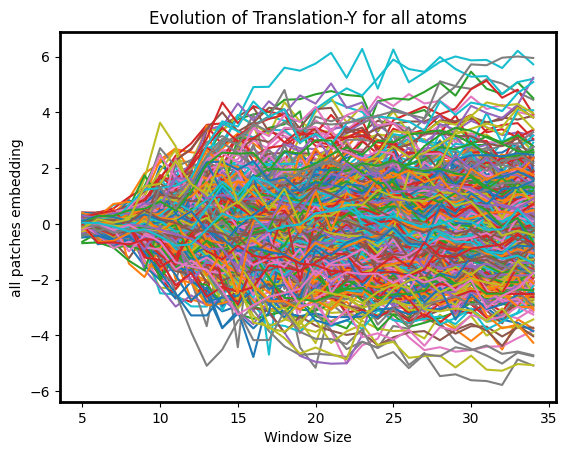

In [ ]:
plt.plot(ws, array_evolution[:,:,2]);
plt.xlabel("Window Size")
plt.ylabel("all patches embedding")
# Adding a title to the plot
plt.title("Evolution of Translation-Y for all atoms")

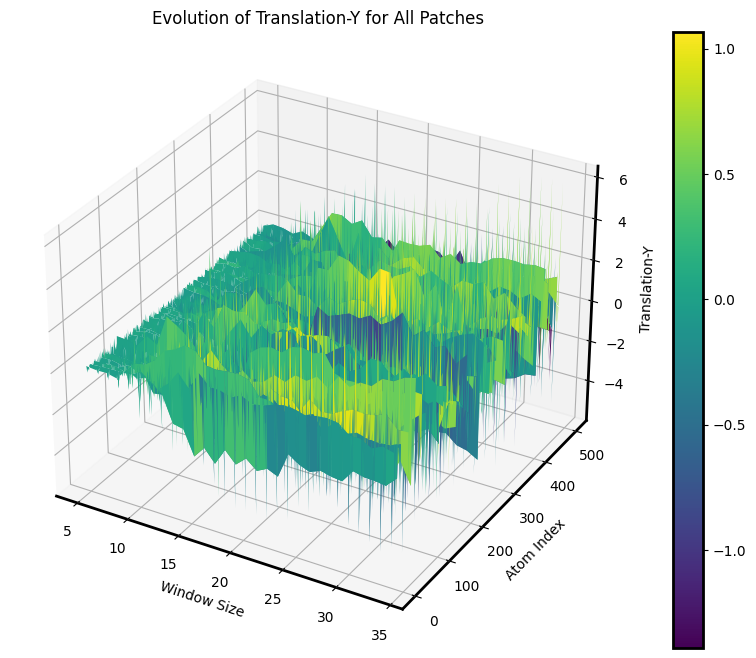

In [ ]:
#Alternate visualization
from mpl_toolkits.mplot3d import Axes3D

X, Y = np.meshgrid(ws, np.arange(array_evolution.shape[1]))
Z = array_evolution[:,:,2].T

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap='viridis')

ax.set_xlabel('Window Size')
ax.set_ylabel('Atom Index')
ax.set_zlabel('Translation-Y')
ax.set_title('Evolution of Translation-Y for All Patches')
fig.colorbar(surf)
plt.show()


Text(0.5, 1.0, 'Evolution of 1st Latent Variables for all atoms')

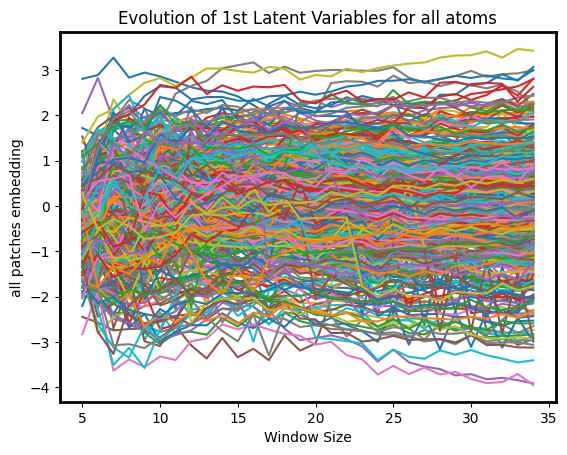

In [ ]:
plt.plot(ws, array_evolution[:,:,3]);
plt.xlabel("Window Size")
plt.ylabel("all patches embedding")
# Adding a title to the plot
plt.title("Evolution of 1st Latent Variables for all atoms")

Text(0.5, 1.0, 'Evolution of 2nd Latent Variables for all atoms')

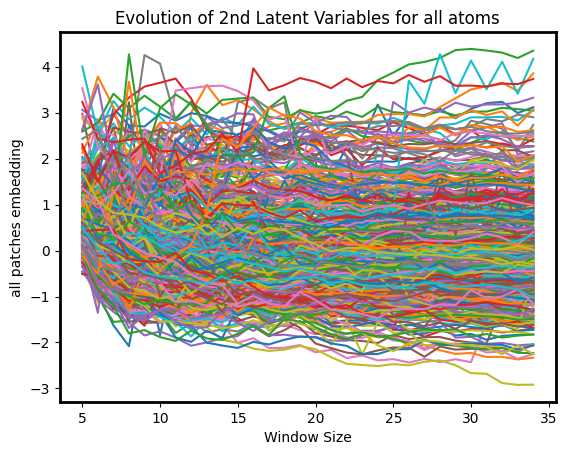

In [ ]:
plt.plot(ws, array_evolution[:,:,4]);
plt.xlabel("Window Size")
plt.ylabel("all patches embedding")
# Adding a title to the plot
plt.title("Evolution of 2nd Latent Variables for all atoms")

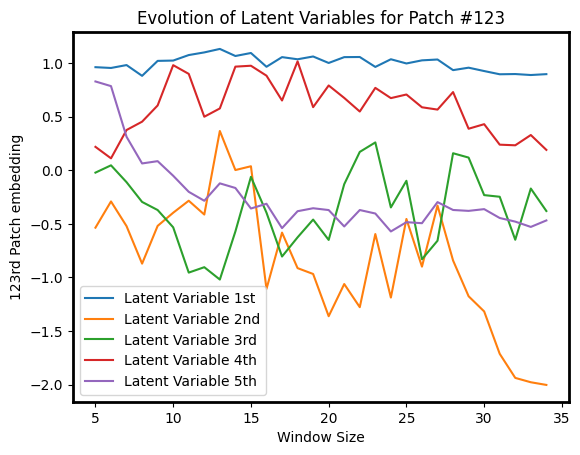

In [ ]:
# plot evolution of the 123rd patch
chosen_atom = 123
latent_variable_labels = ['1st', '2nd', '3rd', '4th', '5th']

for i in range(5):
    plt.plot(ws, array_evolution[:, chosen_atom - 1, i], label=f"Latent Variable {latent_variable_labels[i]}")

# Labeling the axes
plt.xlabel("Window Size")
plt.ylabel("123rd Patch embedding")

# Adding a legend
plt.legend(loc='best')

# Adding a title to the plot
plt.title("Evolution of Latent Variables for Patch #123")

# Show the plot
plt.show()


## Further lets do some dimensionality reduction to get important features and visualize them on atoms
idea is to play with two variables:
1. choose a random variable-> rv = 1 [ranges from 0 to 4 for rtvae]

2. play with nc in dimension reduction

3. visualizing the frames with feature values on each atom

In [ ]:
#****************************************plot features on atoms images

def visualize_on_patches(spm_image_stack, frames_all, frame, z1, z2, z3, filtered_coordinates):
    """
    Visualizes the latent space encodings on the raw STEM image for a given frame.

    Parameters:
    - image
    - z1: Feature set one interested in
    - z2: Feature set two interested in
    - z3: Feature set three interested in

    Returns:
    - None: Displays a matplotlib figure with the visualization.
    """

    spm_image = spm_image_stack[frame]

    z1_i = z1[frames_all == frame]
    z2_i = z2[frames_all == frame]
    z3_i = z2[frames_all == frame]

    col_min0 = z1.min()
    col_max0 = z1.max()
    col_min1 = z2.min()
    col_max1 = z2.max()
    col_min2 = z3.min()
    col_max2 = z3.max()

    fig, ax = plt.subplots(1, 3, figsize=(10, 5), dpi = 200)
    ax[0].imshow(spm_image, cmap = 'Greys')
    ax[0].scatter(filtered_coordinates[:,1],filtered_coordinates[:,0], c=z1_i, s=50,
                  cmap="jet", vmin=col_min0, vmax=col_max0)
    ax[0].set_title("1st Feature", fontsize=18)


    ax[1].imshow(spm_image, cmap = 'Greys')
    ax[1].scatter(filtered_coordinates[:,1],filtered_coordinates[:,0], c=z2_i, s=50,
                  cmap="jet", vmin=col_min0, vmax=col_max0)
    ax[1].set_title("2nd Feature", fontsize=18)


    ax[2].imshow(spm_image, cmap = 'Greys')
    ax[2].scatter(filtered_coordinates[:,1],filtered_coordinates[:,0], c=z3_i, s=50,
                  cmap="jet", vmin=col_min0, vmax=col_max0)
    ax[2].set_title("3rd Feature", fontsize=18)

    cbar = ax[0].figure.colorbar(ax[0].collections[0], ax=ax[0], orientation='vertical', shrink = 0.5)
    # cbar.set_label('1st Features values', rotation=270, labelpad=15)
    cbar = ax[1].figure.colorbar(ax[1].collections[0], ax=ax[1], orientation='vertical', shrink = 0.5)
    # cbar.set_label('2nd Features values', rotation=270, labelpad=15)
    cbar = ax[2].figure.colorbar(ax[2].collections[0], ax=ax[2], orientation='vertical', shrink = 0.5)
    # cbar.set_label('3rd Features values', rotation=270, labelpad=15)

    fig.suptitle(f"vizualize_features_on_patches", fontsize=20)
    plt.savefig(f"vizualize_features_on_patches.png")
    plt.show()


# Example of calling the function:
# visualize_latent_encodings(frame, com_all, frames_all, lattice_coord, z1, z3, STEM_real)


### PCA Analysis for Angle encoding

#### 1. choose a random variable -> rv = 1 [ranges from 0 to 4 for rtvae]

In [ ]:
array_evolution.shape

(30, 500, 5)

In [ ]:
array_evolution_transposed  = array_evolution.transpose(1, 2, 0)
print(array_evolution_transposed.shape)

X_vec = array_evolution_transposed.copy()
d1, d2, d3 = X_vec.shape

# choose a latent variable
lv =0
X_vec = X_vec[:, lv, :]# chosen a latent variable
print("shape of features to undergo dimensionality reduction", X_vec.shape)

(500, 5, 30)
shape of features to undergo dimensionality reduction (500, 30)


In [ ]:
X_vec.shape

(500, 30)

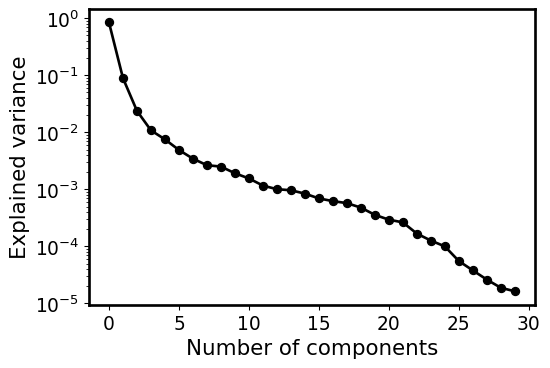

In [ ]:
from sklearn import decomposition

pca = decomposition.PCA(n_components = X_vec.shape[1])
pca.fit(X_vec)
plt.figure(figsize=(6, 4), dpi = 96)
plt.plot(pca.explained_variance_ratio_[0:150], '-o', linewidth=2, c = 'black')
plt.xlabel('Number of components', fontsize = 16)
plt.ylabel('Explained variance', fontsize = 16)

plt.tick_params(labelsize = 14)
plt.yscale('log')

#### 2. play with nc in dimension reduction -> default 10

In [ ]:
# Select number of components
nc = 10

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
#components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(10, 30) (500, 10)


#### 3. visualizing the frame with feature values on each atom-> choose a, b and c

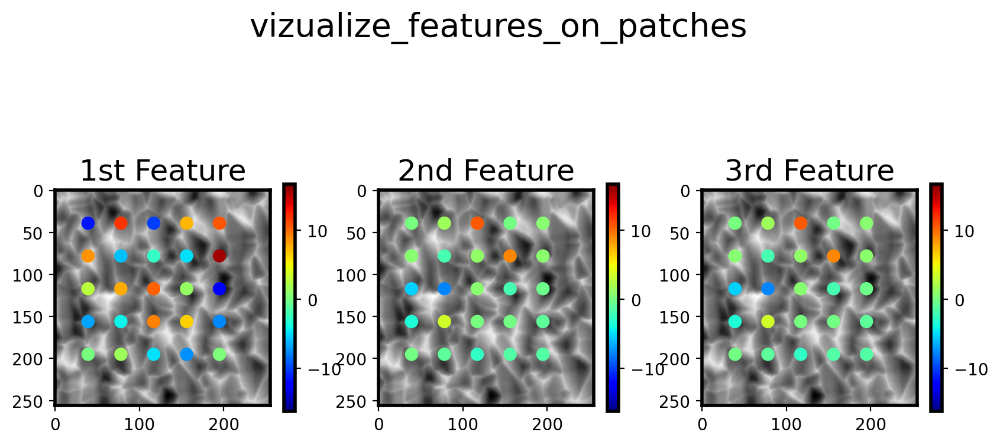

In [ ]:
# here you can choose any varibles from
#choose_indexs
a, b, c = 0, 1, 2# can be values b/w 0 t0 nc --> here nc = 10 ; for instance a=0 means choosing 1st PCA feature vector, 1 is 2nd feature vector...

z1, z2, z3 = X_vec_t[:, a], X_vec_t[:, b], X_vec_t[:, c]#
frame = 1# choose which frame to show?
visualize_on_patches(image_stack,f_num, frame, z1, z2, z3, co_ords[0])

### PCA Analysis for Translation X

#### 1. choose a random variable -> rv = 1 [ranges from 0 to 4 for rtvae]

In [ ]:
array_evolution.shape

(30, 500, 5)

In [ ]:
array_evolution_transposed  = array_evolution.transpose(1, 2, 0)
print(array_evolution_transposed.shape)

X_vec = array_evolution_transposed.copy()
d1, d2, d3 = X_vec.shape

# choose a latent variable
lv =1
X_vec = X_vec[:, lv, :]# chosen a latent variable
print("shape of features to undergo dimensionality reduction", X_vec.shape)

(500, 5, 30)
shape of features to undergo dimensionality reduction (500, 30)


In [ ]:
X_vec.shape

(500, 30)

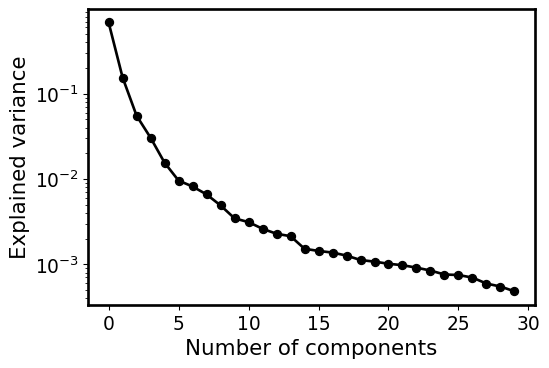

In [ ]:
from sklearn import decomposition

pca = decomposition.PCA(n_components = X_vec.shape[1])
pca.fit(X_vec)
plt.figure(figsize=(6, 4), dpi = 96)
plt.plot(pca.explained_variance_ratio_[0:150], '-o', linewidth=2, c = 'black')
plt.xlabel('Number of components', fontsize = 16)
plt.ylabel('Explained variance', fontsize = 16)

plt.tick_params(labelsize = 14)
plt.yscale('log')

#### 2. play with nc in dimension reduction -> default 10

In [ ]:
# Select number of components
nc = 10

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
#components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(10, 30) (500, 10)


#### 3. visualizing the frame with feature values on each atom-> choose a, b and c

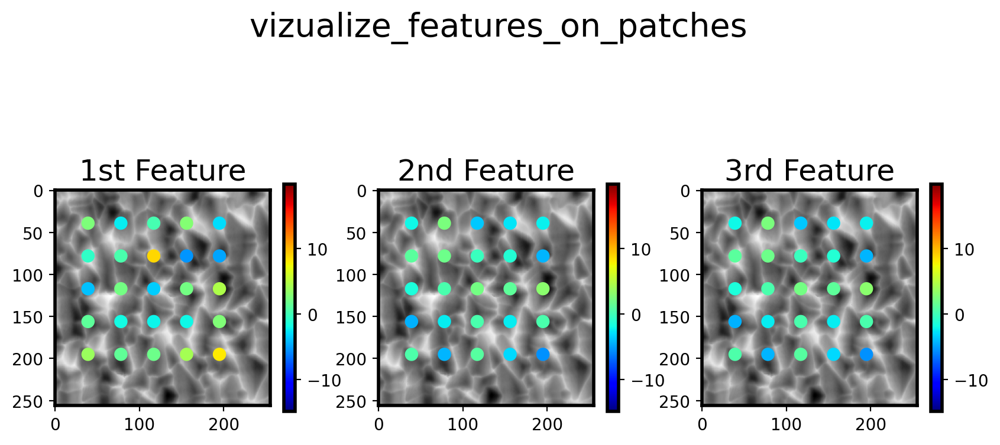

In [ ]:
# here you can choose any varibles from
#choose_indexs
a, b, c = 0, 1, 2# can be values b/w 0 t0 nc --> here nc = 10 ; for instance a=0 means choosing 1st PCA feature vector, 1 is 2nd feature vector...

z1, z2, z3 = X_vec_t[:, a], X_vec_t[:, b], X_vec_t[:, c]#
frame = 1# choose which frame to show?
visualize_on_patches(image_stack,f_num, frame, z1, z2, z3, co_ords[0])

### PCA Analysis for Translation Y

#### 1. choose a random variable -> rv = 1 [ranges from 0 to 4 for rtvae]

In [ ]:
array_evolution.shape

(30, 500, 5)

In [ ]:
array_evolution_transposed  = array_evolution.transpose(1, 2, 0)
print(array_evolution_transposed.shape)

X_vec = array_evolution_transposed.copy()
d1, d2, d3 = X_vec.shape

# choose a latent variable
lv =2
X_vec = X_vec[:, lv, :]# chosen a latent variable
print("shape of features to undergo dimensionality reduction", X_vec.shape)

(500, 5, 30)
shape of features to undergo dimensionality reduction (500, 30)


In [ ]:
X_vec.shape

(500, 30)

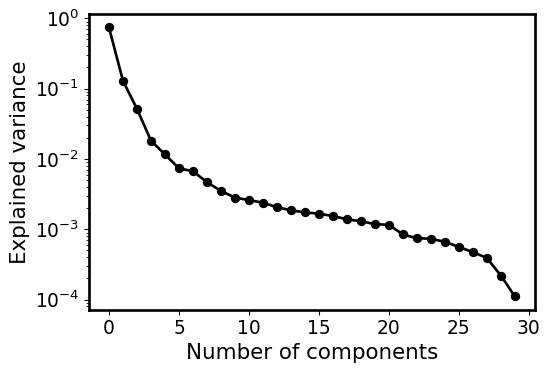

In [ ]:
from sklearn import decomposition

pca = decomposition.PCA(n_components = X_vec.shape[1])
pca.fit(X_vec)
plt.figure(figsize=(6, 4), dpi = 96)
plt.plot(pca.explained_variance_ratio_[0:150], '-o', linewidth=2, c = 'black')
plt.xlabel('Number of components', fontsize = 16)
plt.ylabel('Explained variance', fontsize = 16)

plt.tick_params(labelsize = 14)
plt.yscale('log')

#### 2. play with nc in dimension reduction -> default 10

In [ ]:
# Select number of components
nc = 10

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
#components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(10, 30) (500, 10)


#### 3. visualizing the frame with feature values on each atom-> choose a, b and c

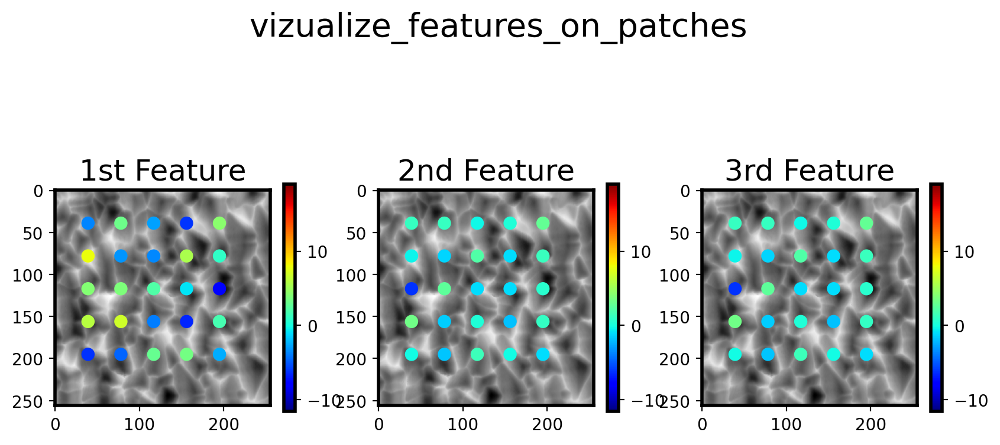

In [ ]:
# here you can choose any varibles from
#choose_indexs
a, b, c = 0, 1, 2# can be values b/w 0 t0 nc --> here nc = 10 ; for instance a=0 means choosing 1st PCA feature vector, 1 is 2nd feature vector...

z1, z2, z3 = X_vec_t[:, a], X_vec_t[:, b], X_vec_t[:, c]#
frame = 1# choose which frame to show?
visualize_on_patches(image_stack,f_num, frame, z1, z2, z3, co_ords[0])

### PCA Analysis for Latent variable 1

#### 1. choose a random variable -> rv = 1 [ranges from 0 to 4 for rtvae]

In [ ]:
array_evolution.shape

(30, 500, 5)

In [ ]:
array_evolution_transposed  = array_evolution.transpose(1, 2, 0)
print(array_evolution_transposed.shape)

X_vec = array_evolution_transposed.copy()
d1, d2, d3 = X_vec.shape

# choose a latent variable
lv =3
X_vec = X_vec[:, lv, :]# chosen a latent variable
print("shape of features to undergo dimensionality reduction", X_vec.shape)

(500, 5, 30)
shape of features to undergo dimensionality reduction (500, 30)


In [ ]:
X_vec.shape

(500, 30)

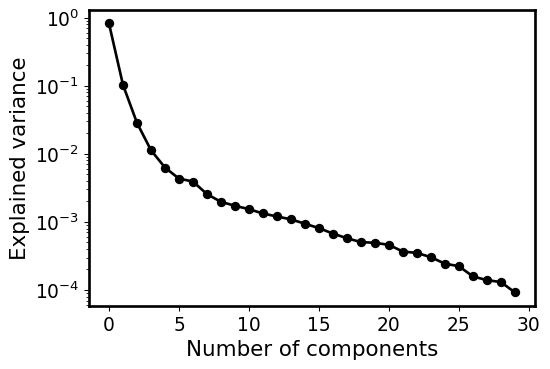

In [ ]:
from sklearn import decomposition

pca = decomposition.PCA(n_components = X_vec.shape[1])
pca.fit(X_vec)
plt.figure(figsize=(6, 4), dpi = 96)
plt.plot(pca.explained_variance_ratio_[0:150], '-o', linewidth=2, c = 'black')
plt.xlabel('Number of components', fontsize = 16)
plt.ylabel('Explained variance', fontsize = 16)

plt.tick_params(labelsize = 14)
plt.yscale('log')

#### 2. play with nc in dimension reduction -> default 10

In [ ]:
# Select number of components
nc = 10

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
#components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(10, 30) (500, 10)


#### 3. visualizing the frame with feature values on each atom-> choose a, b and c

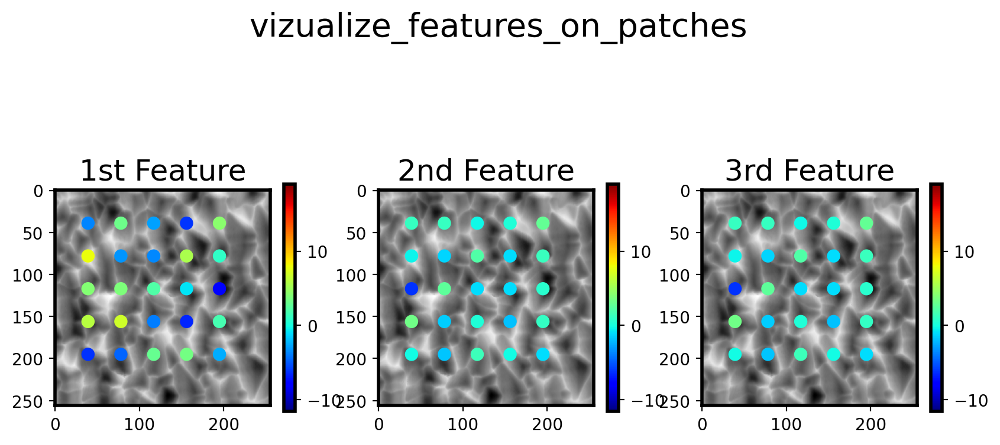

In [ ]:
# here you can choose any varibles from
#choose_indexs
a, b, c = 0, 1, 2# can be values b/w 0 t0 nc --> here nc = 10 ; for instance a=0 means choosing 1st PCA feature vector, 1 is 2nd feature vector...

z1, z2, z3 = X_vec_t[:, a], X_vec_t[:, b], X_vec_t[:, c]#
frame = 1# choose which frame to show?
visualize_on_patches(image_stack,f_num, frame, z1, z2, z3, co_ords[0])

### PCA Analysis for Latent variable 2

#### 1. choose a random variable -> rv = 1 [ranges from 0 to 4 for rtvae]

In [ ]:
array_evolution.shape

(30, 500, 5)

In [ ]:
array_evolution_transposed  = array_evolution.transpose(1, 2, 0)
print(array_evolution_transposed.shape)

X_vec = array_evolution_transposed.copy()
d1, d2, d3 = X_vec.shape

# choose a latent variable
lv =4
X_vec = X_vec[:, lv, :]# chosen a latent variable
print("shape of features to undergo dimensionality reduction", X_vec.shape)

(500, 5, 30)
shape of features to undergo dimensionality reduction (500, 30)


In [ ]:
X_vec.shape

(500, 30)

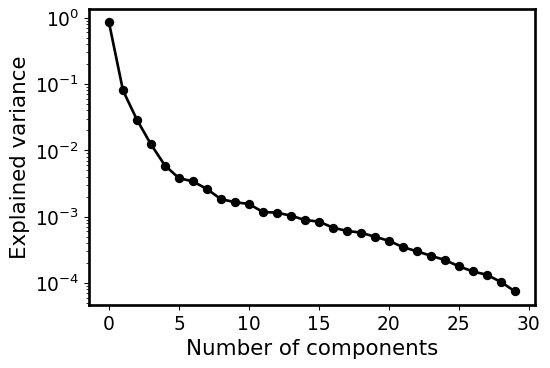

In [ ]:
from sklearn import decomposition

pca = decomposition.PCA(n_components = X_vec.shape[1])
pca.fit(X_vec)
plt.figure(figsize=(6, 4), dpi = 96)
plt.plot(pca.explained_variance_ratio_[0:150], '-o', linewidth=2, c = 'black')
plt.xlabel('Number of components', fontsize = 16)
plt.ylabel('Explained variance', fontsize = 16)

plt.tick_params(labelsize = 14)
plt.yscale('log')

#### 2. play with nc in dimension reduction -> default 10

In [ ]:
# Select number of components
nc = 10

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
#components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(10, 30) (500, 10)


#### 3. visualizing the frame with feature values on each atom-> choose a, b and c

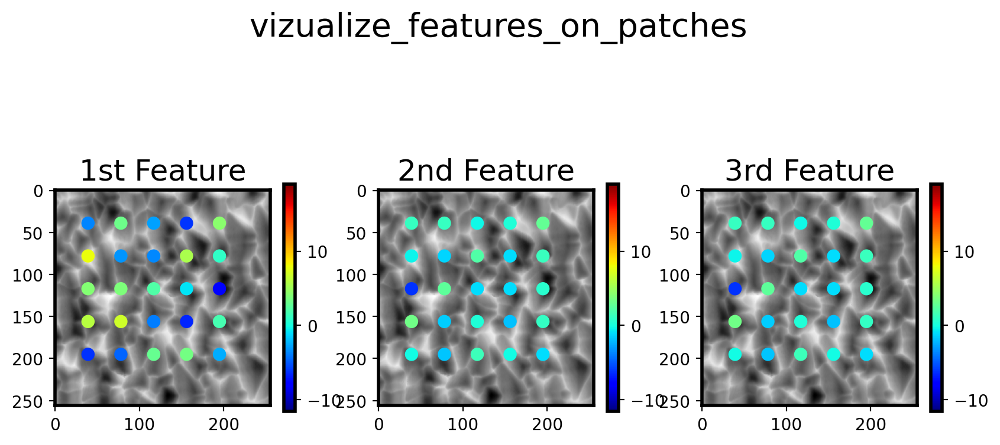

In [ ]:
# here you can choose any varibles from
#choose_indexs
a, b, c = 0, 1, 2# can be values b/w 0 t0 nc --> here nc = 10 ; for instance a=0 means choosing 1st PCA feature vector, 1 is 2nd feature vector...

z1, z2, z3 = X_vec_t[:, a], X_vec_t[:, b], X_vec_t[:, c]#
frame = 1# choose which frame to show?
visualize_on_patches(image_stack,f_num, frame, z1, z2, z3, co_ords[0])

### optional - make video

In [ ]:
import cv2
import os
def create_video_recursive(base_folder, fps=2, frame_size=(640, 480), extension=".png", name = "video"):
    """
    Recursively creates video files from sequences of images in subfolders.

    Args:
        base_folder (str): The path to the base folder from where to start the recursive process.
        fps (int, optional): The frame rate of the output video. Defaults to 30.
        frame_size (tuple, optional): The size of the output video frames as a tuple of (width, height) in pixels. Defaults to (640, 480).
        extension (str, optional): The file extension of the image files to include in the video. Defaults to ".png".

    Returns:
        None
    """

    for folder_path, _, _ in os.walk(base_folder):
        # Get a list of all the image files in the current folder
        file_list = [f for f in os.listdir(folder_path) if f.endswith(extension)]


        if not file_list:
            continue

        output_file = os.path.join(folder_path, f"{os.path.basename(folder_path)}{name}.avi")
        fourcc = cv2.VideoWriter_fourcc(*'XVID')
        out = cv2.VideoWriter(output_file, fourcc, fps, frame_size)

        for file_name in sorted(file_list):  # Sorting to ensure images are processed in order
            # Read the image file
            img = cv2.imread(os.path.join(folder_path, file_name))

            # Resize the image to the output size
            img = cv2.resize(img, frame_size)

            # Write the image to the output video
            out.write(img)

        # Release the VideoWriter object
        out.release()

In [ ]:
create_video_recursive("/content/manifold/", name = "manifold_WTV")

In [ ]:
!zip -r /content/manifold.zip /content/manifold

updating: content/manifold/ (stored 0%)
updating: content/manifold/2dmanifold_window_size32.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size24.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size26.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size22.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size21.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size27.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size37.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size38.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size23.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size25.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size39.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size35.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size10.png (deflated 1%)
updating: content/manifold/manifold_WTV.avi (defla

In [ ]:
files.download(f"/content/manifold.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
create_video_recursive("/content/dist/", frame_size = (1500,1200), name = "dist_WTV")

In [ ]:
!zip -r /content/dist.zip /content/dist

updating: content/dist/ (stored 0%)
updating: content/dist/latent_distribution_window_size18.png (deflated 6%)
updating: content/dist/latent_distribution_window_size31.png (deflated 6%)
updating: content/dist/latent_distribution_window_size12.png (deflated 6%)
updating: content/dist/latent_distribution_window_size25.png (deflated 6%)
updating: content/dist/latent_distribution_window_size14.png (deflated 6%)
updating: content/dist/latent_distribution_window_size34.png (deflated 6%)
updating: content/dist/latent_distribution_window_size22.png (deflated 6%)
updating: content/dist/latent_distribution_window_size19.png (deflated 6%)
updating: content/dist/latent_distribution_window_size21.png (deflated 6%)
updating: content/dist/latent_distribution_window_size30.png (deflated 5%)
updating: content/dist/latent_distribution_window_size23.png (deflated 6%)
updating: content/dist/latent_distribution_window_size11.png (deflated 7%)
updating: content/dist/latent_distribution_window_size27.png (de

In [ ]:
files.download(f"/content/dist.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
create_video_recursive("/content/latent_img/", name = "latent_img_WTV")

In [ ]:
!zip -r /content/latent_img.zip /content/latent_img

  adding: content/latent_img/ (stored 0%)
  adding: content/latent_img/vizualize_features_on_patches55.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches67.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches22.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches37.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches45.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches58.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches12.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches51.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches56.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches29.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches47.png (deflated 2%)
  adding: content/latent_img/vizualize_features_on_patches43.png (deflated 2%)
  adding: 

## Latent variables vs ws and frames

### L1

In [ ]:
array_evolution.shape

(30, 500, 5)

In [ ]:
mean_z = []
mean_z1_w = []
disperse_z = []
disperse_z1_w = []
z1 = array_evolution[:,:,-2]
for w in range(30):
  for frame in np.unique(f_num):
    frame_data = z1[w, f_num == frame]  # Select data points for the current frame
    # frame_data = frame_data.detach().cpu().numpy()
    mean_vector, variance_array = calculate_dispersion(frame_data)
    mean_z.append(mean_vector)
    disperse_z.append(variance_array)
mean_z1_w.append(mean_z)
disperse_z1_w.append(disperse_z)

### L2

In [ ]:
mean_z = []
mean_z2_w = []
disperse_z = []
disperse_z2_w = []
z1 = array_evolution[:,:,-1]
for w in range(30):
  for frame in np.unique(f_num):
    frame_data = z1[w, f_num == frame]  # Select data points for the current frame
    # frame_data = frame_data.detach().cpu().numpy()
    mean_vector, variance_array = calculate_dispersion(frame_data)
    mean_z.append(mean_vector)
    disperse_z.append(variance_array)
mean_z2_w.append(mean_z)
disperse_z2_w.append(disperse_z)

In [ ]:
mean_z1_w = np.array(mean_z1_w)
disperse_z1_w = np.array(disperse_z1_w)
mean_z2_w = np.array(mean_z2_w)
disperse_z2_w = np.array(disperse_z2_w)

mean_z1_w = mean_z1_w.reshape(30,20)
mean_z2_w = mean_z2_w.reshape(30,20)
disperse_z1_w = disperse_z1_w.reshape(30,20)
disperse_z2_w = disperse_z2_w.reshape(30,20)

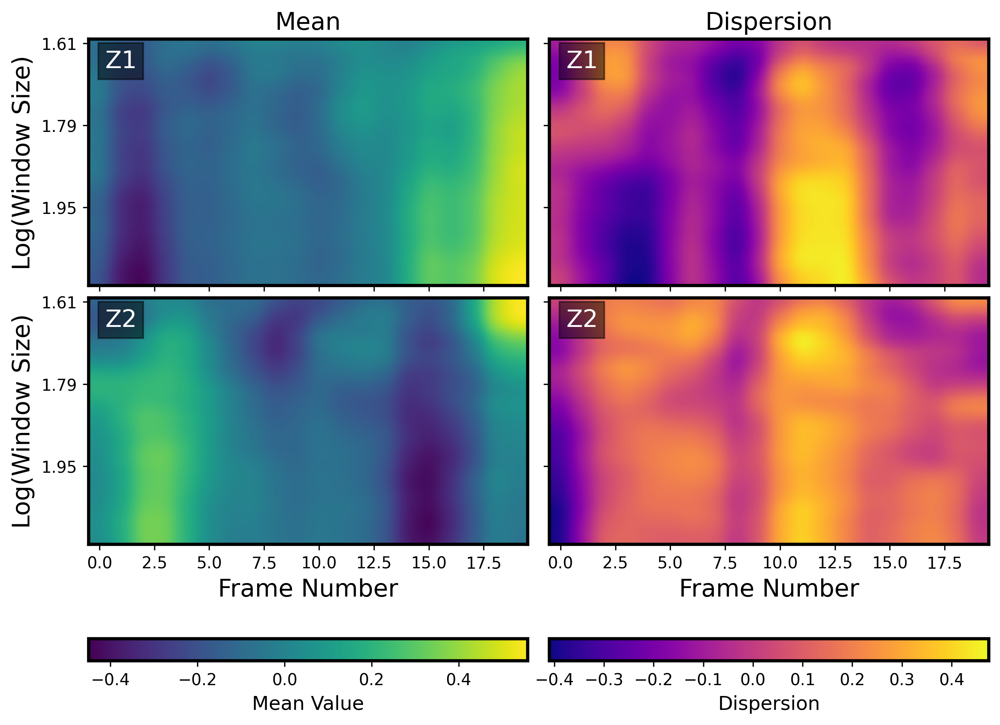

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Function to subtract the mean of each line
def subtract_line_mean(data):
    mean_subtracted = data - np.mean(data, axis=1, keepdims=True)
    return mean_subtracted

log_window_sizes = np.log(ws)
step = 10


# Subtract the mean of each line to highlight variations
mean_z1_w_subtracted = subtract_line_mean(mean_z1_w)
mean_z2_w_subtracted = subtract_line_mean(mean_z2_w)
disperse_z1_w_subtracted = subtract_line_mean(disperse_z1_w)
disperse_z2_w_subtracted = subtract_line_mean(disperse_z2_w)

# Apply Gaussian filter for smoothing
sigma = 1  # Adjust sigma for smoothing effect
mean_z1_w_smooth = gaussian_filter(mean_z1_w_subtracted, sigma=sigma)
mean_z2_w_smooth = gaussian_filter(mean_z2_w_subtracted, sigma=sigma)
disperse_z1_w_smooth = gaussian_filter(disperse_z1_w_subtracted, sigma=sigma)
disperse_z2_w_smooth = gaussian_filter(disperse_z2_w_subtracted, sigma=sigma)

fig, axes = plt.subplots(2, 2, figsize=(10, 8), dpi=300, sharex=True, sharey=True)

# Mean plot 1
im1 = axes[0, 0].imshow(mean_z1_w_smooth, interpolation='gaussian', cmap='viridis')
axes[0, 0].set_aspect('auto')
axes[0, 0].set_ylabel('Log(Window Size)', fontsize=15)
yticks = range(0, mean_z1_w.shape[0], step)
axes[0, 0].set_yticks(yticks)
axes[0, 0].set_yticklabels(np.round(log_window_sizes[:len(yticks)], 2))
axes[0, 0].set_title('Mean', fontsize=15)
# axes[0, 0].grid(True, linestyle='--', alpha=0.5)
axes[0, 0].text(0.25, 3, 'Z1', fontsize=15, color='white', bbox=dict(facecolor='black', alpha=0.5))

# Mean plot 2
im2 = axes[1, 0].imshow(mean_z2_w_smooth, interpolation='gaussian', cmap='viridis')
axes[1, 0].set_aspect('auto')
axes[1, 0].set_ylabel('Log(Window Size)', fontsize=15)
axes[1, 0].set_xlabel('Frame Number', fontsize=15)
# axes[1, 0].grid(True, linestyle='--', alpha=0.5)
axes[1, 0].text(0.25, 3, 'Z2', fontsize=15, color='white', bbox=dict(facecolor='black', alpha=0.5))

# Dispersion plot 1
im3 = axes[0, 1].imshow(disperse_z1_w_smooth, interpolation='gaussian', cmap='plasma')
axes[0, 1].set_aspect('auto')
axes[0, 1].set_title('Dispersion', fontsize=15)
# axes[0, 1].grid(True, linestyle='--', alpha=0.5)
axes[0, 1].text(0.25, 3, 'Z1', fontsize=15, color='white', bbox=dict(facecolor='black', alpha=0.5))

# Dispersion plot 2
im4 = axes[1, 1].imshow(disperse_z2_w_smooth, interpolation='gaussian', cmap='plasma')
axes[1, 1].set_aspect('auto')
axes[1, 1].set_xlabel('Frame Number', fontsize=15)
# axes[1, 1].grid(True, linestyle='--', alpha=0.5)
axes[1, 1].text(0.25, 3, 'Z2', fontsize=15, color='white', bbox=dict(facecolor='black', alpha=0.5))

# Adjust layout
plt.subplots_adjust(hspace=0.05, wspace=0.05, bottom=0.2)

# Add colorbars at the bottom
cbar1 = fig.colorbar(im1, ax=[axes[0, 0], axes[1, 0]], orientation='horizontal', fraction=0.05, pad=0.15, shrink=1)
cbar2 = fig.colorbar(im3, ax=[axes[0, 1], axes[1, 1]], orientation='horizontal', fraction=0.05, pad=0.15, shrink=1)

cbar1.set_label('Mean Value', fontsize=12)
cbar2.set_label('Dispersion', fontsize=12)

plt.show()


##Visualization

In [ ]:
array_evolution.shape

(25, 720, 5)

<ipython-input-185-8a8d0be31fa1>:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=array_evolution[a,:,-2], y=array_evolution[a,:,-1], fill=True, thresh=0.01, levels=100, cmap="autumn", shade=True, alpha=0.3)


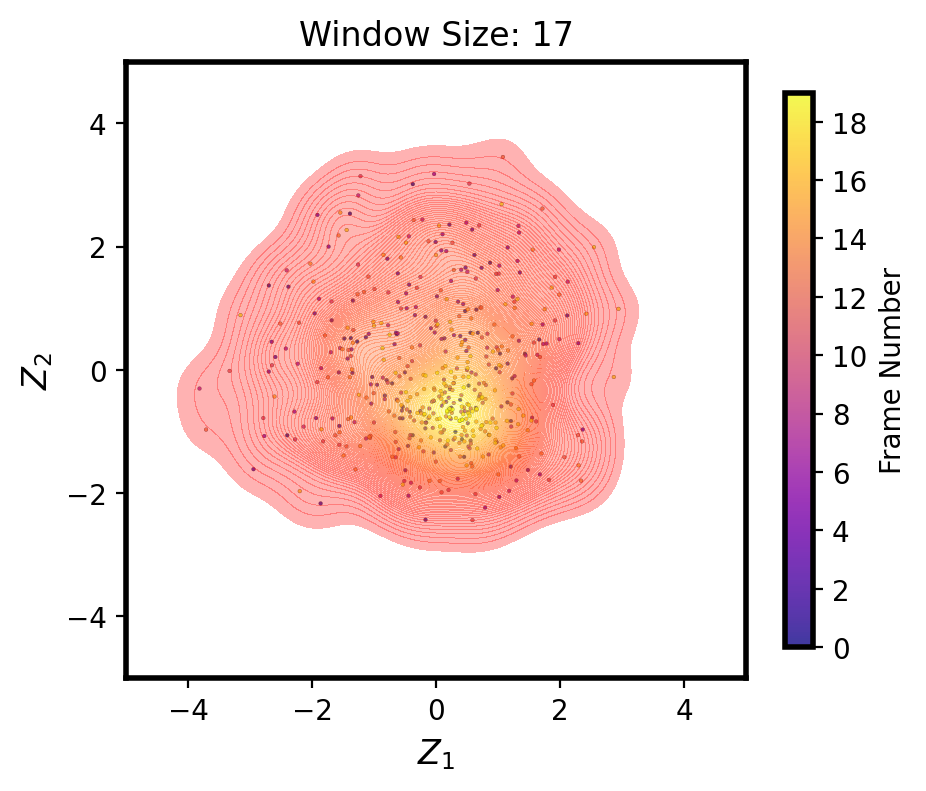

In [ ]:

from matplotlib import ticker

a = 12
fig, _ = plt.subplots(figsize = (5 , 4), dpi = 200)
im = plt.scatter(array_evolution[a,:,-2], array_evolution[a,:,-1], s=1.8, c = f_num, cmap = 'plasma', edgecolors='black',linewidths=0.1, alpha = 0.8)
sns.kdeplot(x=array_evolution[a,:,-2], y=array_evolution[a,:,-1], fill=True, thresh=0.01, levels=100, cmap="autumn", shade=True, alpha=0.3)
ax.set_aspect('equal')

plt.xlabel("$Z_1$", fontsize = 12)
plt.ylabel("$Z_2$", fontsize = 12)
plt.xlim(-5,5)
plt.ylim(-5,5)
plt.title(f"Window Size: {ws[a]}")
cbar = fig.colorbar(im, shrink=.9)
cbar.set_label("Frame Number", fontsize=10)
cbar.ax.tick_params(labelsize=10)
cbar.ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))


In [ ]:
ws[67]

77

<ipython-input-190-ecf3d9536f82>:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(x=array_evolution[a, :, -2], y=array_evolution[a, :, -1], fill=True, thresh=0.01, levels=100, cmap="autumn", shade=True, alpha=0.3, ax=ax)
<ipython-input-190-ecf3d9536f82>:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(), fontsize=14)
<ipython-input-190-ecf3d9536f82>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), fontsize=14)


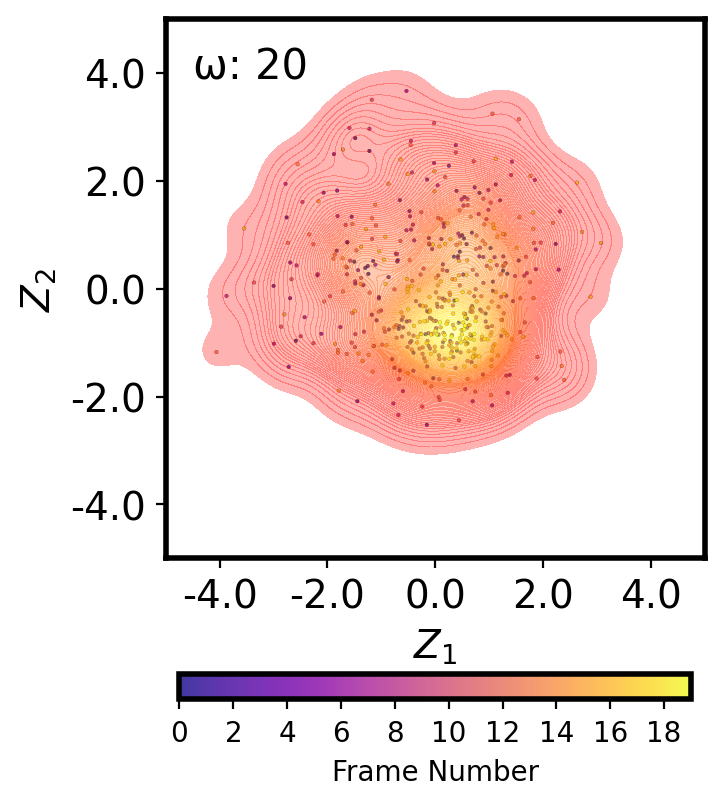

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import ticker

a = 15
fig, ax = plt.subplots(figsize=(6, 5), dpi=200)
im = ax.scatter(array_evolution[a, :, -2], array_evolution[a, :, -1], s=1.8, c=f_num, cmap='plasma', edgecolors='black', linewidths=0.1, alpha=0.8)
sns.kdeplot(x=array_evolution[a, :, -2], y=array_evolution[a, :, -1], fill=True, thresh=0.01, levels=100, cmap="autumn", shade=True, alpha=0.3, ax=ax)
ax.set_aspect('equal')
ax.set_xlabel("$Z_1$", fontsize=14)
ax.set_ylabel("$Z_2$", fontsize=14)
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)


ax.set_xticklabels(ax.get_xticks(), fontsize=14)
ax.set_yticklabels(ax.get_yticks(), fontsize=14)

plt.text(-4.5, 4.5, f'ω: {ws[a]}', fontsize=15, verticalalignment='top', color='black')

# Add colorbar at the bottom
cbar = fig.colorbar(im, ax=ax, orientation='horizontal', shrink=0.55, pad=0.15)
cbar.set_label("Frame Number", fontsize=10)
cbar.ax.tick_params(labelsize=10)
cbar.ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

plt.show()


<ipython-input-204-698d8d84a751>:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticks(), fontsize=14)
<ipython-input-204-698d8d84a751>:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), fontsize=14)
<ipython-input-204-698d8d84a751>:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.1, 1, 0.97])  # Leave space for the colorbar


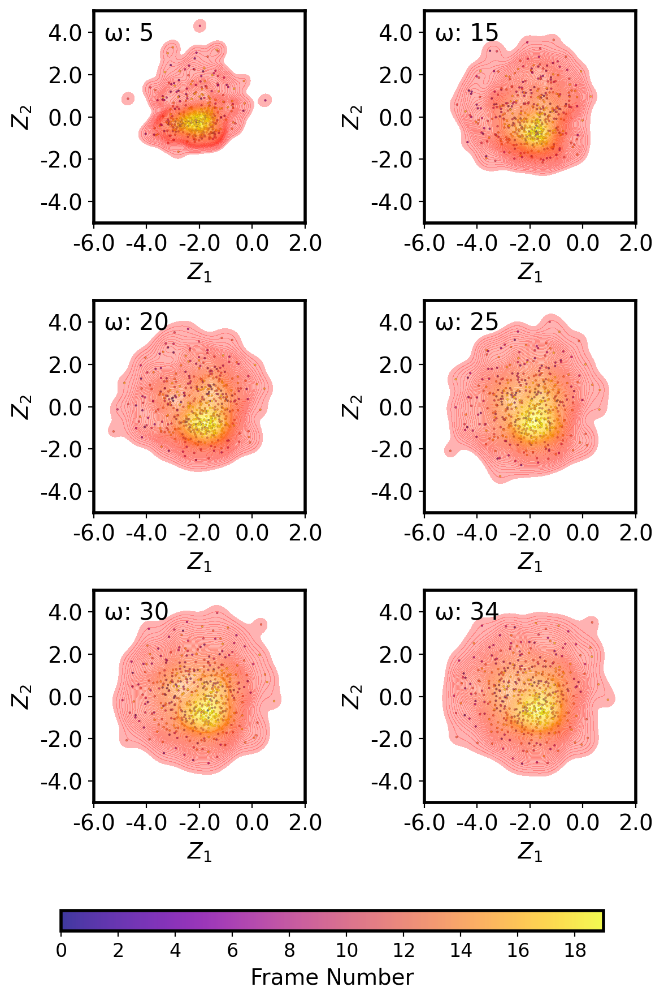

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import ticker

# Define a list of specific 'a' values to plot
a_values = [0, 10, 15, 20, 25, 29]  # Adjust or choose based on your specific requirement

# Create 3x2 subplot structure
fig, axes = plt.subplots(3, 2, figsize=(6, 9), dpi=200)
axes = axes.flatten()  # Flatten the 2D array of axes to make indexing easier in a loop

for i, a in enumerate(a_values):
    ax = axes[i]
    # Scatter plot
    im = ax.scatter(array_evolution[a, :, -2], array_evolution[a, :, -1], s=1.8, c=f_num,
                    cmap='plasma', edgecolors='black', linewidths=0.1, alpha=0.8)
    # KDE plot
    sns.kdeplot(x=array_evolution[a, :, -2], y=array_evolution[a, :, -1], fill=True, thresh=0.01,
                levels=100, cmap="autumn", alpha=0.3, ax=ax)
    ax.set_aspect('equal')
    ax.set_xlabel("$Z_1$", fontsize=14)
    ax.set_ylabel("$Z_2$", fontsize=14)
    ax.set_xlim(-5, 5)
    ax.set_ylim(-5, 5)
    ax.text(-4.5, 4.5, f'ω: {ws[a]}', fontsize=15, verticalalignment='top', color='black')

# Adjust the tick labels on the last subplot to avoid overlapping
for ax in axes:
    ax.set_xticklabels(ax.get_xticks(), fontsize=14)
    ax.set_yticklabels(ax.get_yticks(), fontsize=14)

# Create a single colorbar for all subplots
fig.subplots_adjust(bottom=0.15)
cbar_ax = fig.add_axes([0.1, 0.05, 0.8, 0.02])  # [left, bottom, width, height]
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label("Frame Number", fontsize=14)
cbar.ax.tick_params(labelsize=12)
cbar.ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.1, 1, 0.97])  # Leave space for the colorbar
plt.show()


In [ ]:
create_video_recursive("/content/frame_evolution", fps = 1, frame_size = (1500,1200), name = "Frame_evol_SmBFO")

In [ ]:
!zip -r /content/frame_evolution.zip /content/frame_evolution

In [ ]:
!zip -r /content/frame_evolution.zip /content/frame_evolution

##PCA -> KDE

In [ ]:
array_evolution.shape

(30, 500, 5)

In [ ]:
l1 = array_evolution[:,:,-2]
l2 = array_evolution[:,:,-1]
print(f"Z1.shape is {l1.shape}")
print(f"Z2.shape is {l2.shape}")

Z1.shape is (30, 500)
Z2.shape is (30, 500)


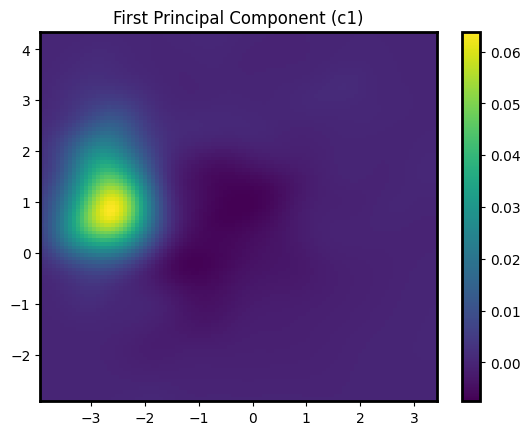

In [ ]:
import numpy as np
from scipy.stats import gaussian_kde
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Step 1: Compute KDEs for each window size
kde_results = []
for i in range(l1.shape[0]):
    data = np.vstack([l1[i, :], l2[i, :]])
    kde = gaussian_kde(data)
    grid_x, grid_y = np.mgrid[data[0].min():data[0].max():100j, data[1].min():data[1].max():100j]
    kde_results.append(kde(np.vstack([grid_x.ravel(), grid_y.ravel()])).reshape(grid_x.shape))

# Step 2 & 3: Flatten, PCA and Reshape
kde_matrix = np.array([kde_result.ravel() for kde_result in kde_results])
pca = PCA(n_components=5)  # Adjust components as needed
pca_results = pca.fit_transform(kde_matrix)

# Reshape PCA results for visualization
pca_components = pca.components_.reshape(-1, 100, 100)
pca_loadings = pca.transform(kde_matrix)
# Visualization of the first PCA component
plt.imshow(pca_components[0], extent=(grid_x.min(), grid_x.max(), grid_y.min(), grid_y.max()), aspect='auto')
plt.colorbar()
plt.title('First Principal Component (c1)')
plt.show()


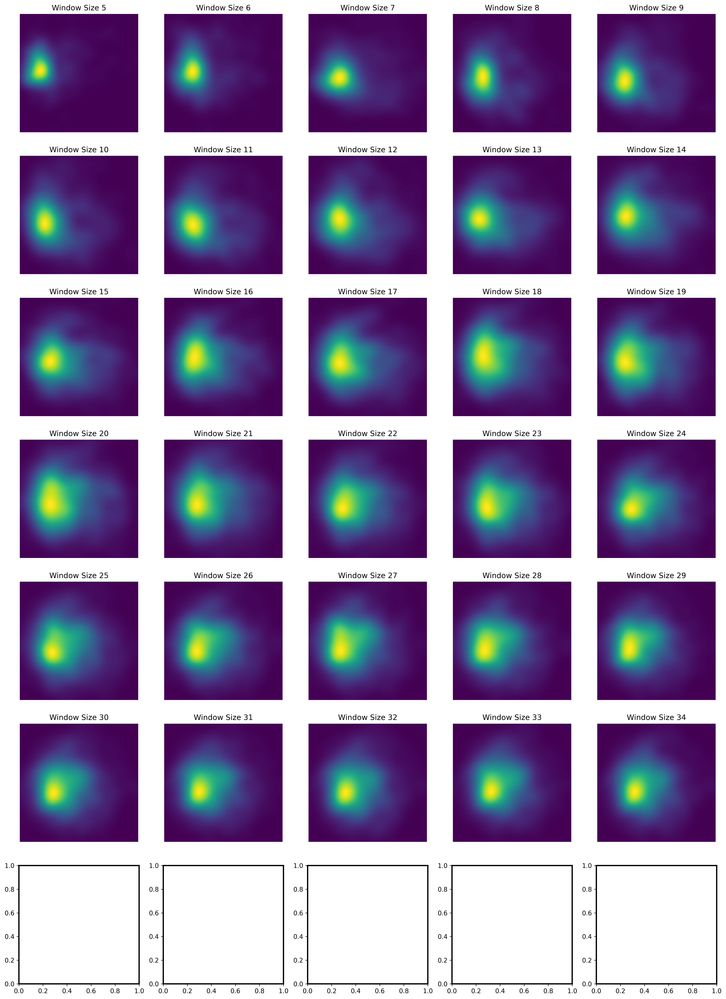

In [ ]:
#Display the KDE for each window size

fig, axes = plt.subplots(7, 5, figsize=(20, 28), dpi = 300)
axes = axes.ravel()

for w in range(30):
    ax = axes[w]
    im = ax.imshow(kde_results[w], cmap='viridis')
    ax.set_title(f'Window Size {ws[w]}')
    ax.axis('off')

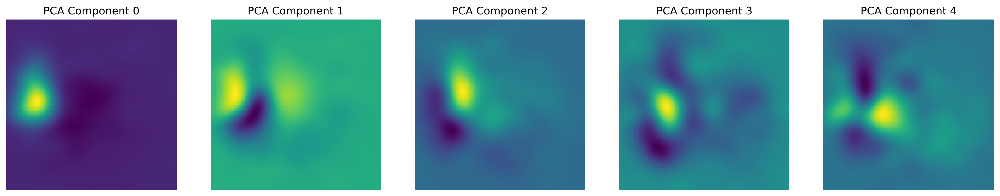

In [ ]:
#Display all 5 PCA components

fig, axes = plt.subplots(1, 5, figsize=(20, 28), dpi = 300)
axes = axes.ravel()

for n in range(5):
    ax = axes[n]
    im = ax.imshow(pca_components[n], cmap='viridis')
    ax.set_title(f'PCA Component {n}')
    ax.axis('off')

Text(0.5, 1.0, 'Loadings Map')

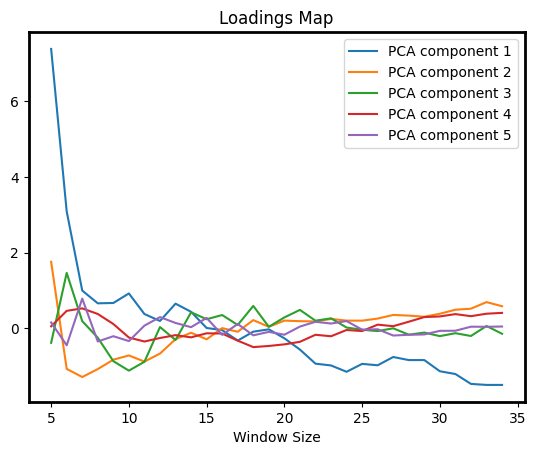

In [ ]:
for i in range(5):
  plt.plot(ws,pca_loadings[:,i], label = f"PCA component {i+1}")
plt.legend()
plt.xlabel("Window Size")
plt.title("Loadings Map")

# Full VAE

In [ ]:
ws

array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34])

In [ ]:
window_size_consistent = 40
# Ititialize model
in_dim = (window_size_consistent, window_size_consistent)
rvae_super = pv.models.iVAE(in_dim, latent_dim=2,   # Number of latent dimensions other than the invariancies
                               hidden_dim_e = [128, 128],   # corresponds to the number of neurons in the hidden layers of the encoder
                               hidden_dim_d = [128, 128],   # corresponds to the number of neurons in the hidden layers of the decoder
                               invariances= ['r', 't'], seed=0, sampler_d = 'continuous_bernoulli')

# future addition: like STEM counter part add rtVAE option-> should be trivial
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_super)


In [ ]:
rvae_super.load_weights("/content/weights_WTV.pt")

In [ ]:
array_evolution = []
co_ords = get_coordinates(image_stack, ws)
for i,j in tqdm(enumerate(ws)):
    print("data curation started")
    patches, f_num = get_uniform_patches(image_stack, co_ords, j)

    patches = normalize(np.squeeze(patches))

    print(f"Number of patches: {patches.shape[0]}")
    resized_imstack = resize_image_stack(patches, size=(40, 40))
    final_train, final_trainloader = get_data_loader(resized_imstack, batch_size = 100) # original batch_size = 512
    print("data curation ended")
    print("window_size", j)
    # for e in range(20):
    #     trainer.step(final_trainloader, scale_factor=3)
    #     trainer.print_statistics()


    z_mean, z_sd = rvae_super.encode(final_train)
    array_evolution.append(z_mean)
    # plot latent manifold:
    get_custom_manifold2d(rvae_super,d = 9, ws = j);   # d corresponds to the number of points sampled in each latent dimension
    # plot latent rep
    plot_latent_rep_with_kde(z_mean, z_sd, ws = j, folder = "dist")
    # plot latent images
    z1, z2, z3 = z_mean[:,0], z_mean[:, -2], z_mean[:, -1] #--> if 3 latent dim
    # visualize_on_patches_latent_images(resized_ht, f_num, 1, z1, z2, z3, co_ords[0], ws = j, folder = "latent_img")
    #visualize_on_patches_latent_images(resized_ht, f_num, 1, z1, z2, z3, co_ords[0], ws = j, folder = "latent_img")
    # visualize_on_patches_latent_images(resized_ht[19], z1, z2, co_ords, ws = j, folder = "latent_img")
    # visualize_latent_images(2, com_all, frames_all, lattice_coord, z1, z3, STEM_real, ws =j)
    # visualize_latent_images(4, com_all, frames_all, lattice_coord, z1, z3, STEM_real, ws =j)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
np.savez("array_evolution_WTV_100epoch_FullVAE.npz", array_evolution= np.array(array_evolution))

## FUll VAE -Post Process

### Mean vs Dispersion of Latent Variables

In [ ]:
array_evolution = np.load("/content/array_evolution_WTV_100epoch_FullVAE.npz")["array_evolution"]
array_evolution.shape

(30, 500, 5)

In [ ]:
array_evolution.shape

(30, 500, 5)

In [ ]:
mean_z = []
mean_z1_w = []
disperse_z = []
disperse_z1_w = []
z1 = array_evolution[:,:,-2]
for w in range(30):
  for frame in np.unique(f_num):
    frame_data = z1[w, f_num == frame]  # Select data points for the current frame
    # frame_data = frame_data.detach().cpu().numpy()
    mean_vector, variance_array = calculate_dispersion(frame_data)
    mean_z.append(mean_vector)
    disperse_z.append(variance_array)
mean_z1_w.append(mean_z)
disperse_z1_w.append(disperse_z)

In [ ]:
mean_z = []
mean_z2_w = []
disperse_z = []
disperse_z2_w = []
z1 = array_evolution[:,:,-1]
for w in range(30):
  for frame in np.unique(f_num):
    frame_data = z1[w, f_num == frame]  # Select data points for the current frame
    # frame_data = frame_data.detach().cpu().numpy()
    mean_vector, variance_array = calculate_dispersion(frame_data)
    mean_z.append(mean_vector)
    disperse_z.append(variance_array)
mean_z2_w.append(mean_z)
disperse_z2_w.append(disperse_z)

In [ ]:
mean_z1_w = np.array(mean_z1_w)
mean_z2_w = np.array(mean_z2_w)
disperse_z1_w = np.array(disperse_z1_w)
disperse_z2_w = np.array(disperse_z2_w)

mean_z1_w = mean_z1_w.reshape(30,20)
mean_z2_w = mean_z2_w.reshape(30,20)
disperse_z1_w = disperse_z1_w.reshape(30,20)
disperse_z2_w = disperse_z2_w.reshape(30,20)

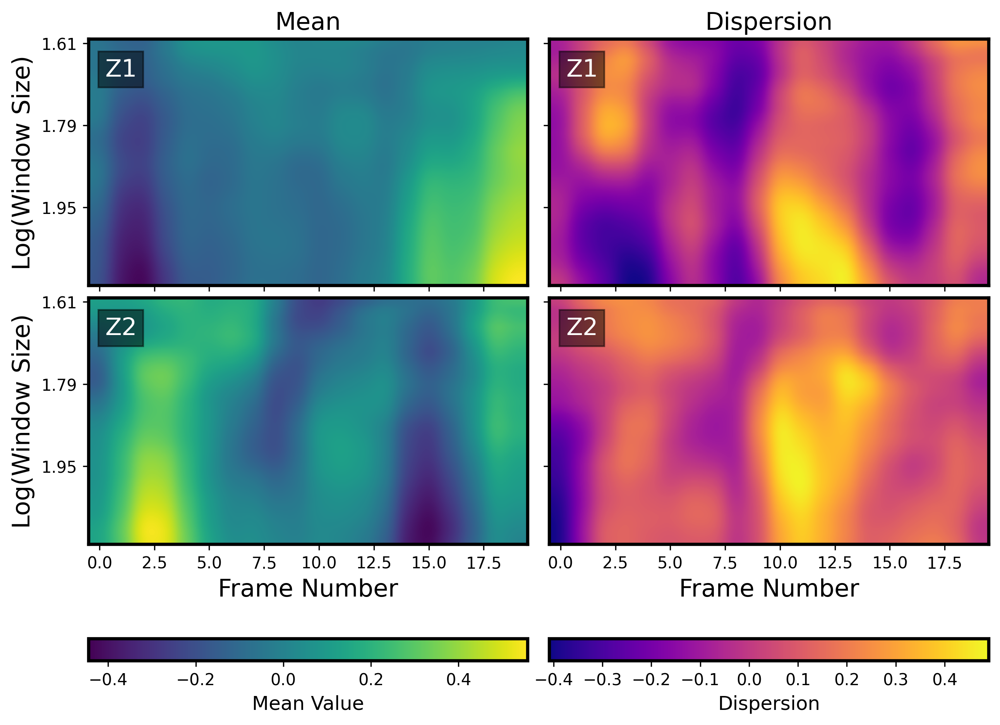

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# Function to subtract the mean of each line
def subtract_line_mean(data):
    mean_subtracted = data - np.mean(data, axis=1, keepdims=True)
    return mean_subtracted

log_window_sizes = np.log(ws)
step = 10


# Subtract the mean of each line to highlight variations
mean_z1_w_subtracted = subtract_line_mean(mean_z1_w)
mean_z2_w_subtracted = subtract_line_mean(mean_z2_w)
disperse_z1_w_subtracted = subtract_line_mean(disperse_z1_w)
disperse_z2_w_subtracted = subtract_line_mean(disperse_z2_w)

# Apply Gaussian filter for smoothing
sigma = 1  # Adjust sigma for smoothing effect
mean_z1_w_smooth = gaussian_filter(mean_z1_w_subtracted, sigma=sigma)
mean_z2_w_smooth = gaussian_filter(mean_z2_w_subtracted, sigma=sigma)
disperse_z1_w_smooth = gaussian_filter(disperse_z1_w_subtracted, sigma=sigma)
disperse_z2_w_smooth = gaussian_filter(disperse_z2_w_subtracted, sigma=sigma)

fig, axes = plt.subplots(2, 2, figsize=(10, 8), dpi=300, sharex=True, sharey=True)

# Mean plot 1
im1 = axes[0, 0].imshow(mean_z1_w_smooth, interpolation='gaussian', cmap='viridis')
axes[0, 0].set_aspect('auto')
axes[0, 0].set_ylabel('Log(Window Size)', fontsize=15)
yticks = range(0, mean_z1_w.shape[0], step)
axes[0, 0].set_yticks(yticks)
axes[0, 0].set_yticklabels(np.round(log_window_sizes[:len(yticks)], 2))
axes[0, 0].set_title('Mean', fontsize=15)
# axes[0, 0].grid(True, linestyle='--', alpha=0.5)
axes[0, 0].text(0.25, 4, 'Z1', fontsize=15, color='white', bbox=dict(facecolor='black', alpha=0.5))

# Mean plot 2
im2 = axes[1, 0].imshow(mean_z2_w_smooth, interpolation='gaussian', cmap='viridis')
axes[1, 0].set_aspect('auto')
axes[1, 0].set_ylabel('Log(Window Size)', fontsize=15)
axes[1, 0].set_xlabel('Frame Number', fontsize=15)
# axes[1, 0].grid(True, linestyle='--', alpha=0.5)
axes[1, 0].text(0.25, 4, 'Z2', fontsize=15, color='white', bbox=dict(facecolor='black', alpha=0.5))

# Dispersion plot 1
im3 = axes[0, 1].imshow(disperse_z1_w_smooth, interpolation='gaussian', cmap='plasma')
axes[0, 1].set_aspect('auto')
axes[0, 1].set_title('Dispersion', fontsize=15)
# axes[0, 1].grid(True, linestyle='--', alpha=0.5)
axes[0, 1].text(0.25, 4, 'Z1', fontsize=15, color='white', bbox=dict(facecolor='black', alpha=0.5))

# Dispersion plot 2
im4 = axes[1, 1].imshow(disperse_z2_w_smooth, interpolation='gaussian', cmap='plasma')
axes[1, 1].set_aspect('auto')
axes[1, 1].set_xlabel('Frame Number', fontsize=15)
# axes[1, 1].grid(True, linestyle='--', alpha=0.5)
axes[1, 1].text(0.25, 4, 'Z2', fontsize=15, color='white', bbox=dict(facecolor='black', alpha=0.5))

# Adjust layout
plt.subplots_adjust(hspace=0.05, wspace=0.05, bottom=0.2)

# Add colorbars at the bottom
cbar1 = fig.colorbar(im1, ax=[axes[0, 0], axes[1, 0]], orientation='horizontal', fraction=0.05, pad=0.15, shrink=1)
cbar2 = fig.colorbar(im3, ax=[axes[0, 1], axes[1, 1]], orientation='horizontal', fraction=0.05, pad=0.15, shrink=1)

cbar1.set_label('Mean Value', fontsize=12)
cbar2.set_label('Dispersion', fontsize=12)

plt.show()


In [ ]:
create_video_recursive("/content/manifold/", name = "manifold_WTV")

In [ ]:
!zip -r /content/manifold.zip /content/manifold

updating: content/manifold/ (stored 0%)
updating: content/manifold/2dmanifold_window_size32.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size24.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size26.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size22.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size21.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size27.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size37.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size38.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size23.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size25.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size39.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size35.png (deflated 1%)
updating: content/manifold/2dmanifold_window_size10.png (deflated 1%)
updating: content/manifold/manifold_WTV.avi (defla

In [ ]:
files.download(f"/content/manifold.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
create_video_recursive("/content/dist/", frame_size = (1500,1200), name = "dist_WTV")

In [ ]:
!zip -r /content/dist.zip /content/dist

updating: content/dist/ (stored 0%)
updating: content/dist/latent_distribution_window_size18.png (deflated 6%)
updating: content/dist/latent_distribution_window_size31.png (deflated 5%)
updating: content/dist/latent_distribution_window_size12.png (deflated 8%)
updating: content/dist/latent_distribution_window_size25.png (deflated 6%)
updating: content/dist/latent_distribution_window_size14.png (deflated 7%)
updating: content/dist/latent_distribution_window_size34.png (deflated 5%)
updating: content/dist/latent_distribution_window_size22.png (deflated 6%)
updating: content/dist/latent_distribution_window_size19.png (deflated 6%)
updating: content/dist/latent_distribution_window_size21.png (deflated 6%)
updating: content/dist/latent_distribution_window_size30.png (deflated 5%)
updating: content/dist/latent_distribution_window_size23.png (deflated 6%)
updating: content/dist/latent_distribution_window_size11.png (deflated 8%)
updating: content/dist/latent_distribution_window_size27.png (de

In [ ]:
files.download(f"/content/dist.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##PCA -> KDE

In [ ]:
array_evolution.shape

(30, 500, 5)

In [ ]:
l1 = array_evolution[:,:,-2]
l2 = array_evolution[:,:,-1]
print(f"Z1.shape is {l1.shape}")
print(f"Z2.shape is {l2.shape}")

Z1.shape is (30, 500)
Z2.shape is (30, 500)


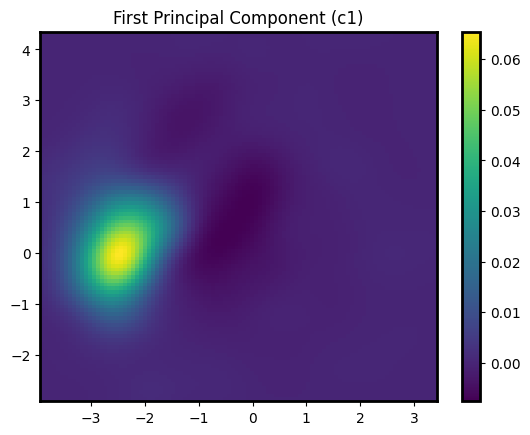

In [ ]:
import numpy as np
from scipy.stats import gaussian_kde
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Step 1: Compute KDEs for each window size
kde_results = []
for i in range(l1.shape[0]):
    data = np.vstack([l1[i, :], l2[i, :]])
    kde = gaussian_kde(data)
    grid_x, grid_y = np.mgrid[data[0].min():data[0].max():100j, data[1].min():data[1].max():100j]
    kde_results.append(kde(np.vstack([grid_x.ravel(), grid_y.ravel()])).reshape(grid_x.shape))

# Step 2 & 3: Flatten, PCA and Reshape
kde_matrix = np.array([kde_result.ravel() for kde_result in kde_results])
pca = PCA(n_components=5)  # Adjust components as needed
pca_results = pca.fit_transform(kde_matrix)

# Reshape PCA results for visualization
pca_components = pca.components_.reshape(-1, 100, 100)
pca_loadings = pca.transform(kde_matrix)
# Visualization of the first PCA component
plt.imshow(pca_components[0], extent=(grid_x.min(), grid_x.max(), grid_y.min(), grid_y.max()), aspect='auto')
plt.colorbar()
plt.title('First Principal Component (c1)')
plt.show()


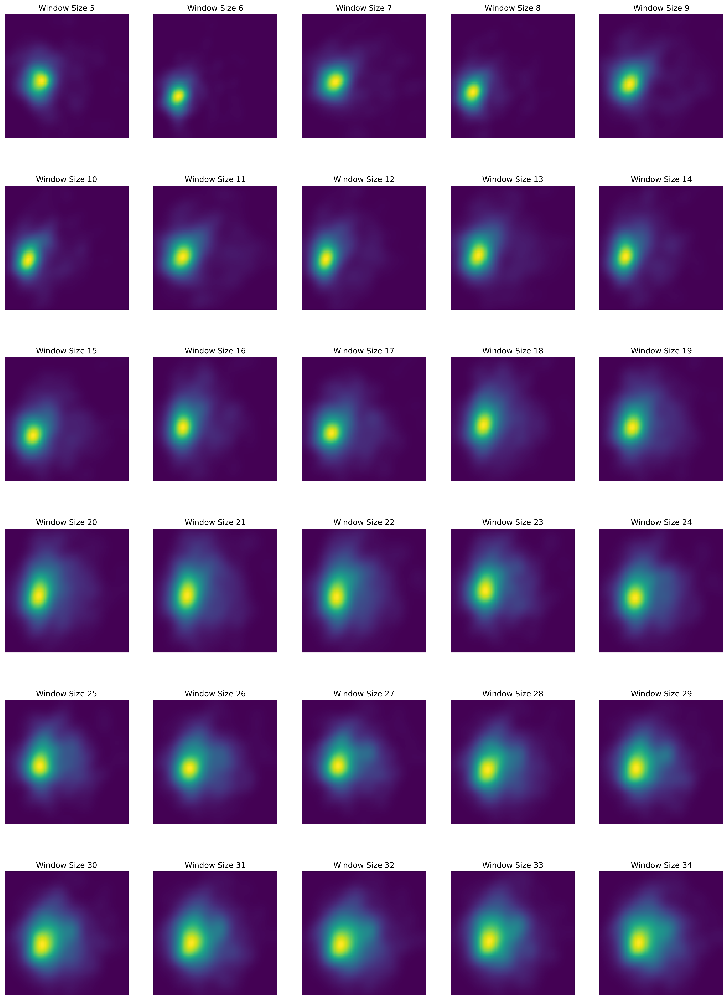

In [ ]:
#Display the KDE for each window size

fig, axes = plt.subplots(6, 5, figsize=(20, 28), dpi = 300)
axes = axes.ravel()

for w in range(30):
    ax = axes[w]
    im = ax.imshow(kde_results[w], cmap='viridis')
    ax.set_title(f'Window Size {ws[w]}')
    ax.axis('off')

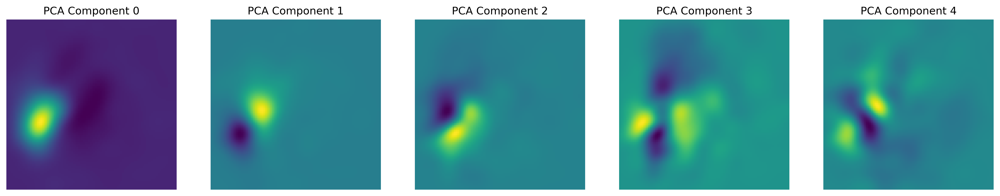

In [ ]:
#Display all 5 PCA components

fig, axes = plt.subplots(1, 5, figsize=(20, 28), dpi = 300)
axes = axes.ravel()

for n in range(5):
    ax = axes[n]
    im = ax.imshow(pca_components[n], cmap='viridis')
    ax.set_title(f'PCA Component {n}')
    ax.axis('off')

Text(0.5, 1.0, 'Loadings Map')

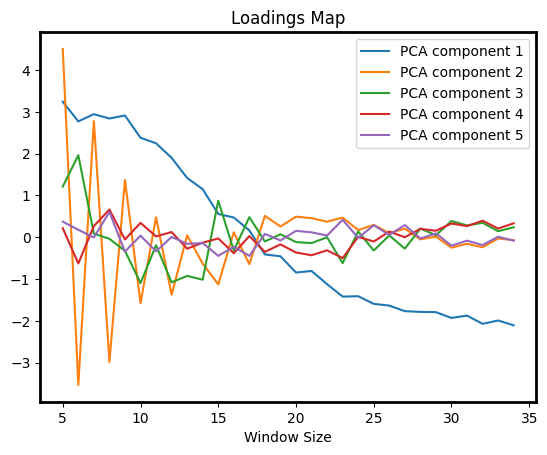

In [ ]:
for i in range(5):
  plt.plot(ws,pca_loadings[:,i], label = f"PCA component {i+1}")
plt.legend()
plt.xlabel("Window Size")
plt.title("Loadings Map")